# Kinematics QC: v7.2.1 7000-A vs v7.6.8 9100-A

This notebook compares only the original `v3_v7.2.1` 7000-A run against the standard `v3tk_v7.6.8` 9100-A run for `IC3392`, `NGC4383`, and `NGC4419`.

The checks are deliberately narrow:

- Stellar `SIGMA`, `H3`, and `H4` are shown over all finite pixels. The MUSE instrumental-dispersion values are printed as context from the ESO resolving-power table. The practical diagnostic uses the red end of each KIN fitting range, while the blue/worst value is printed only to explain the wavelength dependence.
- Line properties use a simple `Flux/Err` quality ratio from the fitted line flux and flux error. This is only a line-fit quality screen.
- GAS kinematics use the observed `VEL` and observed `SIGMA` maps. For GAS scatter/residual plots, points are marked as orange stars when either the pairwise `Flux/Err < 3` or the observed `SIGMA` is below the line's `_SIGMA_CORR` value in either run.



## Instrumental-resolution conventions

For stellar-dispersion context, the MUSE instrumental dispersion is computed from the ESO/VLT MUSE spectral-resolution table. The table gives resolving power `R(lambda) = lambda / Delta_lambda_FWHM`; this notebook linearly interpolates `R(lambda)` and converts it with:

`FWHM_inst = lambda / R(lambda)`

`sigma_lambda_inst = FWHM_inst / 2.354820045`

`sigma_v_inst = c * sigma_lambda_inst / lambda = c / (2.354820045 * R(lambda))`

The blue end has the largest instrumental velocity sigma. That value is useful context, but it is too conservative as a single warning scale for broad KIN fits and makes the 7000-A and 9100-A setups look artificially identical. The notebook therefore prints blue/worst, median, and red-end values. The red-end value is used as the practical diagnostic overlay, so the 7000-A and 9100-A setups have different stellar instrumental scales. This is **not** a quadrature correction and it is not used to discard stellar pixels in the main summaries.

For pPXF/nGIST stellar kinematics, do not simply subtract the MUSE instrumental sigma from the final stellar sigma map unless the template/data resolution treatment is known. If the templates were matched to the MUSE resolution before fitting, the fitted stellar `SIGMA` should be interpreted as the stellar LOSVD under that setup.

For GAS dispersion, use the actual per-line `_SIGMA_CORR` extensions from the GAS maps. In this notebook those values are used to flag observed GAS `SIGMA < SIGMA_CORR`; the displayed GAS `SIGMA` comparisons remain the observed FITS-product values.


In [1]:
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import Normalize, TwoSlopeNorm

plt.style.use('seaborn-v0_8-whitegrid')
pd.set_option('display.max_columns', 160)
pd.set_option('display.max_colwidth', 180)

root = Path('.')
GALAXIES = ['IC3392', 'NGC4383', 'NGC4419']
RUN_ORDER = ['v721_7000', 'v768_9100']
BASELINE_RUN = 'v721_7000'
COMPARE_RUN = 'v768_9100'
PAIR_KEY = 'v768_9100_minus_v721_7000'

C_KMS = 299792.458
FWHM_TO_SIGMA = 2.354820045
LINE_FLUX_ERR_RATIO_MIN = 3.0
MAX_SCATTER_POINTS = 30000

KIN_QUANTITIES = ['V', 'SIGMA', 'H3', 'H4']
KIN_CENTERED = {'V', 'H3', 'H4'}
GAS_LINES = ['HB4861', 'HA6562', 'NII6583', 'SII6716']
LINE_SCATTER_LINES = ['HA6562', 'NII6583', 'SII6716']
LINE_MAP_LINES = ['HA6562', 'NII6583']

RUNS = {
    galaxy: {
        'v721_7000': {
            'label': 'nGIST v7.2.1, 7000-A setup',
            'plot_label': '7.2.1 7000',
            'kin_path': root / 'v3_v7.2.1' / galaxy / f'{galaxy}_KIN_maps.fits',
            'gas_path': root / 'v3_v7.2.1' / galaxy / f'{galaxy}_gas_BIN_maps.fits',
            'config_path': root / 'v3_v7.2.1' / galaxy / 'CONFIG',
        },
        'v768_9100': {
            'label': 'nGIST v7.6.8, 9100-A setup',
            'plot_label': '7.6.8 9100',
            'kin_path': root / 'v3tk_v7.6.8' / galaxy / f'{galaxy}_kin_maps.fits',
            'gas_path': root / 'v3tk_v7.6.8' / galaxy / f'{galaxy}_gas_bin_maps.fits',
            'config_path': root / 'v3tk_v7.6.8' / galaxy / 'CONFIG',
        },
    }
    for galaxy in GALAXIES
}

# ESO MUSE spectral-resolution table: wavelength [Angstrom], resolving power R.
MUSE_R_TABLE = np.array([
    [4650.0, 1609.0],
    [5000.0, 1750.0],
    [5500.0, 1978.0],
    [6000.0, 2227.0],
    [6500.0, 2484.0],
    [7000.0, 2737.0],
    [7500.0, 2975.0],
    [8000.0, 3183.0],
    [8500.0, 3350.0],
    [9000.0, 3465.0],
    [9350.0, 3506.0],
])


def muse_inst_sigma(lambda_A):
    """
    Return MUSE instrumental resolution at wavelength lambda_A.

    Parameters
    ----------
    lambda_A : float or array
        Wavelength in Angstrom.

    Returns
    -------
    R : float or array
        Interpolated spectral resolving power.
    fwhm_A : float or array
        Instrumental FWHM in Angstrom.
    sigma_A : float or array
        Instrumental Gaussian sigma in Angstrom.
    sigma_kms : float or array
        Instrumental Gaussian sigma in km/s.
    """
    lambda_A = np.asarray(lambda_A, dtype=float)

    R = np.interp(lambda_A, MUSE_R_TABLE[:, 0], MUSE_R_TABLE[:, 1])
    fwhm_A = lambda_A / R
    sigma_A = fwhm_A / FWHM_TO_SIGMA
    sigma_kms = C_KMS * sigma_A / lambda_A

    return R, fwhm_A, sigma_A, sigma_kms


def as_scalar(value):
    return float(np.asarray(value))


def stellar_inst_sigma_summary(lmin, lmax, n=1024):
    lmin = float(lmin)
    lmax = float(lmax)
    wave = np.linspace(lmin, lmax, n)
    r_values, fwhm_values, sigma_A_values, sigma_kms_values = muse_inst_sigma(wave)
    worst_idx = int(np.nanargmax(sigma_kms_values))
    blue_r, blue_fwhm_A, blue_sigma_A, blue_sigma_kms = [as_scalar(v) for v in muse_inst_sigma(lmin)]
    red_r, red_fwhm_A, red_sigma_A, red_sigma_kms = [as_scalar(v) for v in muse_inst_sigma(lmax)]
    return {
        'stellar_inst_sigma_blue_kms': blue_sigma_kms,
        'stellar_inst_sigma_blue_A': blue_sigma_A,
        'stellar_inst_fwhm_blue_A': blue_fwhm_A,
        'stellar_inst_sigma_blue_wave_A': lmin,
        'stellar_inst_R_blue': blue_r,
        'stellar_inst_sigma_worst_kms': float(sigma_kms_values[worst_idx]),
        'stellar_inst_sigma_worst_A': float(sigma_A_values[worst_idx]),
        'stellar_inst_fwhm_worst_A': float(fwhm_values[worst_idx]),
        'stellar_inst_sigma_worst_wave_A': float(wave[worst_idx]),
        'stellar_inst_R_at_worst': float(r_values[worst_idx]),
        'stellar_inst_sigma_median_kms': float(np.nanmedian(sigma_kms_values)),
        'stellar_inst_sigma_red_kms': red_sigma_kms,
        'stellar_inst_sigma_red_A': red_sigma_A,
        'stellar_inst_fwhm_red_A': red_fwhm_A,
        'stellar_inst_sigma_red_wave_A': lmax,
        'stellar_inst_R_red': red_r,
    }


MUSE_EXAMPLE_WAVE_A = np.array([5000.0, 6000.0, 6500.0, 6562.8, 7000.0, 8000.0, 9300.0])
example_R, example_fwhm_A, example_sigma_A, example_sigma_kms = muse_inst_sigma(MUSE_EXAMPLE_WAVE_A)
MUSE_EXAMPLE_TABLE = pd.DataFrame({
    'wavelength_A': MUSE_EXAMPLE_WAVE_A,
    'R': example_R,
    'FWHM_inst_A': example_fwhm_A,
    'sigma_inst_A': example_sigma_A,
    'sigma_inst_kms': example_sigma_kms,
})


def describe_path(path):
    path = Path(path)
    if not path.exists():
        return {'exists': False, 'size_mb': np.nan, 'modified': ''}
    return {
        'exists': True,
        'size_mb': path.stat().st_size / 1024**2,
        'modified': datetime.fromtimestamp(path.stat().st_mtime).strftime('%Y-%m-%d %H:%M:%S'),
    }

print(f'Line Flux/Err ratio cut: {LINE_FLUX_ERR_RATIO_MIN:g}')
print('Only comparing v7.2.1 7000-A against v7.6.8 9100-A.')
display(MUSE_EXAMPLE_TABLE.round({'R': 1, 'FWHM_inst_A': 3, 'sigma_inst_A': 3, 'sigma_inst_kms': 2}))
ha = MUSE_EXAMPLE_TABLE[MUSE_EXAMPLE_TABLE['wavelength_A'].eq(6562.8)].iloc[0]
print(
    f"H-alpha check: R={ha['R']:.1f}, FWHM_inst={ha['FWHM_inst_A']:.3f} A, "
    f"sigma_inst={ha['sigma_inst_A']:.3f} A, sigma_inst={ha['sigma_inst_kms']:.2f} km/s"
)


Line Flux/Err ratio cut: 3
Only comparing v7.2.1 7000-A against v7.6.8 9100-A.


,wavelength_A,R,FWHM_inst_A,sigma_inst_A,sigma_inst_kms
0,5000.0,1750.0,2.857,1.213,72.75
1,6000.0,2227.0,2.694,1.144,57.17
2,6500.0,2484.0,2.617,1.111,51.25
3,6562.8,2515.8,2.609,1.108,50.60
4,7000.0,2737.0,2.558,1.086,46.51
5,8000.0,3183.0,2.513,1.067,40.00
6,9300.0,3500.1,2.657,1.128,36.37


H-alpha check: R=2515.8, FWHM_inst=2.609 A, sigma_inst=1.108 A, sigma_inst=50.60 km/s


## Files and CONFIG context

This section confirms the input files and prints blue/worst, median, and red-end MUSE stellar instrumental dispersion. The red-end value is used as the practical warning scale for stellar dispersion/high-order interpretation, not a hard filter. The blue/worst value is printed to show why a single worst-end threshold would be too conservative for these broad KIN wavelength ranges.


In [2]:
def parse_simple_config(path):
    config = {}
    section = None
    with open(path) as fh:
        for raw_line in fh:
            line = raw_line.rstrip()
            if not line or line.lstrip().startswith('#'):
                continue
            if not line.startswith(' ') and line.endswith(':'):
                section = line[:-1]
                config[section] = {}
                continue
            if section is not None and ':' in line:
                key, value = line.strip().split(':', 1)
                config[section][key.strip()] = value.strip()
    return config


def config_value(config, section, key, default=''):
    return config.get(section, {}).get(key, default)


def config_float(config, section, key, default=np.nan):
    value = config_value(config, section, key, default)
    try:
        return float(value)
    except (TypeError, ValueError):
        return default

CONFIG_FIELDS = [
    ('GENERAL', 'INPUT'),
    ('GENERAL', 'LSF_DATA'),
    ('READ_DATA', 'LMIN_TOT'),
    ('READ_DATA', 'LMAX_TOT'),
    ('PREPARE_SPECTRA', 'VELSCALE'),
    ('KIN', 'SPEC_MASK'),
    ('KIN', 'LMIN'),
    ('KIN', 'LMAX'),
    ('KIN', 'SIGMA'),
    ('KIN', 'BIAS'),
    ('KIN', 'ADEG'),
    ('KIN', 'MDEG'),
    ('KIN', 'LSF_TEMP'),
    ('KIN', 'LIBRARY'),
    ('GAS', 'SPEC_MASK'),
    ('GAS', 'LEVEL'),
    ('GAS', 'LMIN'),
    ('GAS', 'LMAX'),
    ('GAS', 'MDEG'),
    ('GAS', 'EMI_FILE'),
]

configs = {}
stellar_inst_thresholds = {}
file_rows = []
config_rows = []

for galaxy in GALAXIES:
    configs[galaxy] = {}
    stellar_inst_thresholds[galaxy] = {}
    for run_key in RUN_ORDER:
        run = RUNS[galaxy][run_key]
        for kind in ['kin_path', 'gas_path', 'config_path']:
            status = describe_path(run[kind])
            if not status['exists']:
                raise FileNotFoundError(f'Missing {galaxy} {run_key} {kind}: {run[kind]}')
        file_rows.append({
            'galaxy': galaxy,
            'run_key': run_key,
            'label': run['label'],
            'kin_path': str(run['kin_path']),
            'gas_path': str(run['gas_path']),
            'config_path': str(run['config_path']),
            'kin_modified': describe_path(run['kin_path'])['modified'],
            'gas_modified': describe_path(run['gas_path'])['modified'],
        })

        config = parse_simple_config(run['config_path'])
        configs[galaxy][run_key] = config
        row = {'galaxy': galaxy, 'run_key': run_key, 'label': run['label']}
        for section, key in CONFIG_FIELDS:
            row[f'{section}.{key}'] = config_value(config, section, key)
        kin_lmin = config_float(config, 'KIN', 'LMIN')
        kin_lmax = config_float(config, 'KIN', 'LMAX')
        if np.isfinite(kin_lmin) and np.isfinite(kin_lmax):
            inst = stellar_inst_sigma_summary(kin_lmin, kin_lmax)
            row.update(inst)
            stellar_inst_thresholds[galaxy][run_key] = inst['stellar_inst_sigma_red_kms']
        else:
            stellar_inst_thresholds[galaxy][run_key] = np.nan
        config_rows.append(row)

file_summary = pd.DataFrame(file_rows)
config_summary = pd.DataFrame(config_rows)
display(file_summary)
display(config_summary)

stellar_inst_summary = config_summary[
    [
        'galaxy', 'run_key', 'KIN.LMIN', 'KIN.LMAX',
        'stellar_inst_sigma_blue_kms', 'stellar_inst_sigma_blue_A', 'stellar_inst_fwhm_blue_A', 'stellar_inst_sigma_blue_wave_A', 'stellar_inst_R_blue',
        'stellar_inst_sigma_median_kms',
        'stellar_inst_sigma_red_kms', 'stellar_inst_sigma_red_A', 'stellar_inst_fwhm_red_A', 'stellar_inst_sigma_red_wave_A', 'stellar_inst_R_red',
        'stellar_inst_sigma_worst_kms', 'stellar_inst_sigma_worst_A', 'stellar_inst_fwhm_worst_A', 'stellar_inst_sigma_worst_wave_A', 'stellar_inst_R_at_worst',
    ]
]
display(stellar_inst_summary)

for _, row in stellar_inst_summary.iterrows():
    print(
        f"{row['galaxy']} {row['run_key']}: MUSE stellar sigma_inst "
        f"blue={row['stellar_inst_sigma_blue_kms']:.2f} km/s "
        f"(FWHM={row['stellar_inst_fwhm_blue_A']:.3f} A, R={row['stellar_inst_R_blue']:.1f}) "
        f"at {row['stellar_inst_sigma_blue_wave_A']:.0f} A; "
        f"median={row['stellar_inst_sigma_median_kms']:.2f} km/s; "
        f"red={row['stellar_inst_sigma_red_kms']:.2f} km/s "
        f"(FWHM={row['stellar_inst_fwhm_red_A']:.3f} A, R={row['stellar_inst_R_red']:.1f}) "
        f"at {row['stellar_inst_sigma_red_wave_A']:.0f} A; red-end value used as diagnostic overlay only"
    )


,galaxy,run_key,label,kin_path,gas_path,config_path,kin_modified,gas_modified
0,IC3392,v721_7000,"nGIST v7.2.1, 7000-A setup",v3_v7.2.1/IC3392/IC3392_KIN_maps.fits,v3_v7.2.1/IC3392/IC3392_gas_BIN_maps.fits,v3_v7.2.1/IC3392/CONFIG,2026-03-15 13:55:42,2026-03-15 13:58:31
1,IC3392,v768_9100,"nGIST v7.6.8, 9100-A setup",v3tk_v7.6.8/IC3392/IC3392_kin_maps.fits,v3tk_v7.6.8/IC3392/IC3392_gas_bin_maps.fits,v3tk_v7.6.8/IC3392/CONFIG,2026-03-21 13:47:53,2026-03-21 13:49:31
2,NGC4383,v721_7000,"nGIST v7.2.1, 7000-A setup",v3_v7.2.1/NGC4383/NGC4383_KIN_maps.fits,v3_v7.2.1/NGC4383/NGC4383_gas_BIN_maps.fits,v3_v7.2.1/NGC4383/CONFIG,2024-11-09 02:51:42,2024-11-08 05:36:30
3,NGC4383,v768_9100,"nGIST v7.6.8, 9100-A setup",v3tk_v7.6.8/NGC4383/NGC4383_kin_maps.fits,v3tk_v7.6.8/NGC4383/NGC4383_gas_bin_maps.fits,v3tk_v7.6.8/NGC4383/CONFIG,2026-04-27 14:14:28,2026-03-25 09:45:29
4,NGC4419,v721_7000,"nGIST v7.2.1, 7000-A setup",v3_v7.2.1/NGC4419/NGC4419_KIN_maps.fits,v3_v7.2.1/NGC4419/NGC4419_gas_BIN_maps.fits,v3_v7.2.1/NGC4419/CONFIG,2024-11-07 09:50:51,2024-11-15 14:08:18
5,NGC4419,v768_9100,"nGIST v7.6.8, 9100-A setup",v3tk_v7.6.8/NGC4419/NGC4419_kin_maps.fits,v3tk_v7.6.8/NGC4419/NGC4419_gas_bin_maps.fits,v3tk_v7.6.8/NGC4419/CONFIG,2026-03-26 09:20:46,2026-03-26 09:20:17


,galaxy,run_key,label,GENERAL.INPUT,GENERAL.LSF_DATA,READ_DATA.LMIN_TOT,READ_DATA.LMAX_TOT,PREPARE_SPECTRA.VELSCALE,KIN.SPEC_MASK,KIN.LMIN,KIN.LMAX,KIN.SIGMA,KIN.BIAS,KIN.ADEG,KIN.MDEG,KIN.LSF_TEMP,KIN.LIBRARY,GAS.SPEC_MASK,GAS.LEVEL,GAS.LMIN,GAS.LMAX,GAS.MDEG,GAS.EMI_FILE,stellar_inst_sigma_blue_kms,stellar_inst_sigma_blue_A,stellar_inst_fwhm_blue_A,stellar_inst_sigma_blue_wave_A,stellar_inst_R_blue,stellar_inst_sigma_worst_kms,stellar_inst_sigma_worst_A,stellar_inst_fwhm_worst_A,stellar_inst_sigma_worst_wave_A,stellar_inst_R_at_worst,stellar_inst_sigma_median_kms,stellar_inst_sigma_red_kms,stellar_inst_sigma_red_A,stellar_inst_fwhm_red_A,stellar_inst_sigma_red_wave_A,stellar_inst_R_red
0,IC3392,v721_7000,"nGIST v7.2.1, 7000-A setup",/arc/projects/mauve/cubes/v3.0/IC3392_DATACUBE_FINAL_WCS_Pall_mad_red_v3.fits,lsf_MUSE-WFM,4800,7000,53,specMask_KIN,4800,7000,66,Auto,12,0,lsf_MILES,MILES_EMLINES/,specMask_GAS,BIN,4800,7000,8,emissionLinesPHANGS.config,76.259708,1.221,2.875235,4800.0,1669.428571,76.259708,1.221,2.875235,4800.0,1669.428571,58.474253,46.514481,1.086089,2.557545,7000.0,2737.000000
1,IC3392,v768_9100,"nGIST v7.6.8, 9100-A setup",/scratch/pawsey1308/mauve/cubes/v3tk/IC3392_DATACUBE_FINAL_WCS_Pall_mad_red_v3tk.fits,lsf_MUSE-WFM-MILES,4800,9100,41,specMask_KIN_narrow10,4800,9100,82,muse_snr_prefit,23,0,lsf_MILES,EMILES_baseFe_EMLINES/,specMask_GAS_narrow10,BOTH,4800,9100,23,emissionLines_ppxf_full.config,76.259708,1.221,2.875235,4800.0,1669.428571,76.259708,1.221,2.875235,4800.0,1669.428571,46.948466,36.617946,1.111513,2.617414,9100.0,3476.714286
2,NGC4383,v721_7000,"nGIST v7.2.1, 7000-A setup",/arc/projects/mauve/cubes/v3.0/NGC4383_DATACUBE_FINAL_WCS_Pall_mad_red_v3.fits,lsf_MUSE-WFM,4800,7000,53,specMask_KIN,4800,7000,63,Auto,12,0,lsf_MILES,MILES_EMLINES/,specMask_GAS,BIN,4800,7000,8,emissionLinesPHANGS.config,76.259708,1.221,2.875235,4800.0,1669.428571,76.259708,1.221,2.875235,4800.0,1669.428571,58.474253,46.514481,1.086089,2.557545,7000.0,2737.000000
3,NGC4383,v768_9100,"nGIST v7.6.8, 9100-A setup",/scratch/pawsey1308/mauve/cubes/v3tk/NGC4383_DATACUBE_FINAL_WCS_Pall_mad_red_v3tk.fits,lsf_MUSE-WFM-MILES,4800,9100,41,specMask_KIN_narrow10,4800,9100,63,muse_snr_prefit,23,0,lsf_MILES,EMILES_baseFe_EMLINES/,specMask_GAS_narrow10,BOTH,4800,9100,23,emissionLines_ppxf_full.config,76.259708,1.221,2.875235,4800.0,1669.428571,76.259708,1.221,2.875235,4800.0,1669.428571,46.948466,36.617946,1.111513,2.617414,9100.0,3476.714286
4,NGC4419,v721_7000,"nGIST v7.2.1, 7000-A setup",/arc/projects/mauve/cubes/v3.0/NGC4419_DATACUBE_FINAL_WCS_Pall_mad_red_v3.fits,lsf_MUSE-WFM,4800,7000,53,specMask_KIN,4800,7000,95,Auto,12,0,lsf_MILES,MILES_EMLINES/,specMask_GAS,BIN,4800,7000,8,emissionLinesPHANGS.config,76.259708,1.221,2.875235,4800.0,1669.428571,76.259708,1.221,2.875235,4800.0,1669.428571,58.474253,46.514481,1.086089,2.557545,7000.0,2737.000000
5,NGC4419,v768_9100,"nGIST v7.6.8, 9100-A setup",/scratch/pawsey1308/mauve/cubes/v3tk/NGC4419_DATACUBE_FINAL_WCS_Pall_mad_red_v3tk.fits,lsf_MUSE-WFM-MILES,4800,9100,41,specMask_KIN_narrow10,4800,9100,107,muse_snr_prefit,23,0,lsf_MILES,EMILES_baseFe_EMLINES/,specMask_GAS_narrow10,BOTH,4800,9100,23,emissionLines_ppxf_full.config,76.259708,1.221,2.875235,4800.0,1669.428571,76.259708,1.221,2.875235,4800.0,1669.428571,46.948466,36.617946,1.111513,2.617414,9100.0,3476.714286


,galaxy,run_key,KIN.LMIN,KIN.LMAX,stellar_inst_sigma_blue_kms,stellar_inst_sigma_blue_A,stellar_inst_fwhm_blue_A,stellar_inst_sigma_blue_wave_A,stellar_inst_R_blue,stellar_inst_sigma_median_kms,stellar_inst_sigma_red_kms,stellar_inst_sigma_red_A,stellar_inst_fwhm_red_A,stellar_inst_sigma_red_wave_A,stellar_inst_R_red,stellar_inst_sigma_worst_kms,stellar_inst_sigma_worst_A,stellar_inst_fwhm_worst_A,stellar_inst_sigma_worst_wave_A,stellar_inst_R_at_worst
0,IC3392,v721_7000,4800,7000,76.259708,1.221,2.875235,4800.0,1669.428571,58.474253,46.514481,1.086089,2.557545,7000.0,2737.000000,76.259708,1.221,2.875235,4800.0,1669.428571
1,IC3392,v768_9100,4800,9100,76.259708,1.221,2.875235,4800.0,1669.428571,46.948466,36.617946,1.111513,2.617414,9100.0,3476.714286,76.259708,1.221,2.875235,4800.0,1669.428571
2,NGC4383,v721_7000,4800,7000,76.259708,1.221,2.875235,4800.0,1669.428571,58.474253,46.514481,1.086089,2.557545,7000.0,2737.000000,76.259708,1.221,2.875235,4800.0,1669.428571
3,NGC4383,v768_9100,4800,9100,76.259708,1.221,2.875235,4800.0,1669.428571,46.948466,36.617946,1.111513,2.617414,9100.0,3476.714286,76.259708,1.221,2.875235,4800.0,1669.428571
4,NGC4419,v721_7000,4800,7000,76.259708,1.221,2.875235,4800.0,1669.428571,58.474253,46.514481,1.086089,2.557545,7000.0,2737.000000,76.259708,1.221,2.875235,4800.0,1669.428571
5,NGC4419,v768_9100,4800,9100,76.259708,1.221,2.875235,4800.0,1669.428571,46.948466,36.617946,1.111513,2.617414,9100.0,3476.714286,76.259708,1.221,2.875235,4800.0,1669.428571


IC3392 v721_7000: MUSE stellar sigma_inst blue=76.26 km/s (FWHM=2.875 A, R=1669.4) at 4800 A; median=58.47 km/s; red=46.51 km/s (FWHM=2.558 A, R=2737.0) at 7000 A; red-end value used as diagnostic overlay only
IC3392 v768_9100: MUSE stellar sigma_inst blue=76.26 km/s (FWHM=2.875 A, R=1669.4) at 4800 A; median=46.95 km/s; red=36.62 km/s (FWHM=2.617 A, R=3476.7) at 9100 A; red-end value used as diagnostic overlay only
NGC4383 v721_7000: MUSE stellar sigma_inst blue=76.26 km/s (FWHM=2.875 A, R=1669.4) at 4800 A; median=58.47 km/s; red=46.51 km/s (FWHM=2.558 A, R=2737.0) at 7000 A; red-end value used as diagnostic overlay only
NGC4383 v768_9100: MUSE stellar sigma_inst blue=76.26 km/s (FWHM=2.875 A, R=1669.4) at 4800 A; median=46.95 km/s; red=36.62 km/s (FWHM=2.617 A, R=3476.7) at 9100 A; red-end value used as diagnostic overlay only
NGC4419 v721_7000: MUSE stellar sigma_inst blue=76.26 km/s (FWHM=2.875 A, R=1669.4) at 4800 A; median=58.47 km/s; red=46.51 km/s (FWHM=2.558 A, R=2737.0) at 7

## FITS helpers and map loading

The old and new maps are aligned by cropping to their common lower-left overlap if their shapes differ.


In [3]:
def read_map(path, extname):
    with fits.open(path, memmap=False, ignore_missing_end=True) as hdul:
        arr = np.array(hdul[extname].data, dtype=float)
    arr[~np.isfinite(arr)] = np.nan
    return arr


def available_hdus(path):
    with fits.open(path, memmap=False, ignore_missing_end=True) as hdul:
        return [hdu.name for hdu in hdul]


def check_extensions(path, extensions):
    names = set(available_hdus(path))
    missing = [ext for ext in extensions if ext not in names]
    if missing:
        raise KeyError(f'{path} missing extensions: {missing}')


def align_map_pair(old_map, new_map, label=None):
    if old_map.shape == new_map.shape:
        return old_map, new_map
    if old_map.ndim != new_map.ndim:
        raise ValueError(f'{label or "map"}: cannot align shapes {old_map.shape} and {new_map.shape}')
    common_shape = tuple(min(a, b) for a, b in zip(old_map.shape, new_map.shape))
    slices = tuple(slice(0, n) for n in common_shape)
    print(f'Warning: {label or "map"} shape mismatch old {old_map.shape}, new {new_map.shape}; using common crop {common_shape}.')
    return old_map[slices], new_map[slices]


def finite_values(arrays):
    chunks = []
    for arr in arrays:
        vals = np.asarray(arr)[np.isfinite(arr)]
        if vals.size:
            chunks.append(vals.ravel())
    if not chunks:
        return np.array([], dtype=float)
    return np.concatenate(chunks)


def robust_limits(arr, p=(2, 98), fallback=(0.0, 1.0)):
    vals = np.asarray(arr)[np.isfinite(arr)]
    if vals.size == 0:
        return fallback
    lo, hi = np.nanpercentile(vals, p)
    if not np.isfinite(lo) or not np.isfinite(hi) or lo == hi:
        lo, hi = np.nanmin(vals), np.nanmax(vals)
        if lo == hi:
            hi = lo + 1.0
    return float(lo), float(hi)


def robust_symmetric_limit(arr, percentile=98, fallback=1.0):
    vals = np.abs(np.asarray(arr)[np.isfinite(arr)])
    if vals.size == 0:
        return float(fallback)
    limit = np.nanpercentile(vals, percentile)
    if not np.isfinite(limit) or limit == 0:
        limit = np.nanmax(vals)
    if not np.isfinite(limit) or limit == 0:
        limit = fallback
    return float(limit)


def percent_change_map(baseline_map, compare_map):
    pct = np.full(baseline_map.shape, np.nan, dtype=float)
    mask = np.isfinite(baseline_map) & np.isfinite(compare_map) & (baseline_map != 0)
    pct[mask] = 100.0 * (compare_map[mask] - baseline_map[mask]) / np.abs(baseline_map[mask])
    return pct, mask


def compare_stats(baseline_map, compare_map, mask=None):
    finite_mask = np.isfinite(baseline_map) & np.isfinite(compare_map)
    used_mask = finite_mask if mask is None else finite_mask & mask
    out = {
        'n_all_finite': int(finite_mask.sum()),
        'n_used': int(used_mask.sum()),
        'used_fraction_of_finite': float(used_mask.sum() / finite_mask.sum()) if finite_mask.sum() else np.nan,
    }
    if used_mask.sum() == 0:
        out.update({
            'pearson_r': np.nan,
            'median_baseline': np.nan,
            'median_compare': np.nan,
            'median_delta_new_minus_old': np.nan,
            'median_abs_delta': np.nan,
            'p16_delta': np.nan,
            'p84_delta': np.nan,
            'rms_delta': np.nan,
            'median_pct_change': np.nan,
            'median_abs_pct_change': np.nan,
            'rms_pct_change': np.nan,
        })
        return out

    baseline_vals = baseline_map[used_mask]
    compare_vals = compare_map[used_mask]
    delta = compare_vals - baseline_vals
    if baseline_vals.size > 1 and np.nanstd(baseline_vals) > 0 and np.nanstd(compare_vals) > 0:
        pearson_r = float(np.corrcoef(baseline_vals, compare_vals)[0, 1])
    else:
        pearson_r = np.nan
    pct_map, pct_mask = percent_change_map(baseline_map, compare_map)
    pct_vals = pct_map[pct_mask & used_mask]
    out.update({
        'pearson_r': pearson_r,
        'median_baseline': float(np.nanmedian(baseline_vals)),
        'median_compare': float(np.nanmedian(compare_vals)),
        'median_delta_new_minus_old': float(np.nanmedian(delta)),
        'median_abs_delta': float(np.nanmedian(np.abs(delta))),
        'p16_delta': float(np.nanpercentile(delta, 16)),
        'p84_delta': float(np.nanpercentile(delta, 84)),
        'rms_delta': float(np.sqrt(np.nanmean(delta**2))),
        'median_pct_change': float(np.nanmedian(pct_vals)) if pct_vals.size else np.nan,
        'median_abs_pct_change': float(np.nanmedian(np.abs(pct_vals))) if pct_vals.size else np.nan,
        'rms_pct_change': float(np.sqrt(np.nanmean(pct_vals**2))) if pct_vals.size else np.nan,
    })
    return out


In [4]:
KIN_EXTENSIONS = ['V', 'SIGMA', 'H3', 'H4']
GAS_REQUIRED_EXTENSIONS = []
for line in GAS_LINES:
    GAS_REQUIRED_EXTENSIONS.extend([
        f'{line}_FLUX', f'{line}_FLUX_ERR', f'{line}_VEL', f'{line}_VEL_ERR',
        f'{line}_SIGMA', f'{line}_SIGMA_ERR', f'{line}_SIGMA_CORR'
    ])

for galaxy in GALAXIES:
    for run_key in RUN_ORDER:
        check_extensions(RUNS[galaxy][run_key]['kin_path'], KIN_EXTENSIONS)
        check_extensions(RUNS[galaxy][run_key]['gas_path'], GAS_REQUIRED_EXTENSIONS)

kin_maps = {galaxy: {} for galaxy in GALAXIES}
gas_maps = {galaxy: {} for galaxy in GALAXIES}

for galaxy in GALAXIES:
    for extname in KIN_EXTENSIONS:
        old_map = read_map(RUNS[galaxy][BASELINE_RUN]['kin_path'], extname)
        new_map = read_map(RUNS[galaxy][COMPARE_RUN]['kin_path'], extname)
        old_map, new_map = align_map_pair(old_map, new_map, f'{galaxy} KIN_{extname}')
        kin_maps[galaxy][extname] = {BASELINE_RUN: old_map, COMPARE_RUN: new_map}

    for extname in GAS_REQUIRED_EXTENSIONS:
        old_map = read_map(RUNS[galaxy][BASELINE_RUN]['gas_path'], extname)
        new_map = read_map(RUNS[galaxy][COMPARE_RUN]['gas_path'], extname)
        old_map, new_map = align_map_pair(old_map, new_map, f'{galaxy} GAS_{extname}')
        gas_maps[galaxy][extname] = {BASELINE_RUN: old_map, COMPARE_RUN: new_map}

shape_rows = []
for galaxy in GALAXIES:
    shape_rows.append({
        'galaxy': galaxy,
        'KIN_shape': kin_maps[galaxy]['V'][BASELINE_RUN].shape,
        'GAS_shape': gas_maps[galaxy]['HA6562_VEL'][BASELINE_RUN].shape,
    })
display(pd.DataFrame(shape_rows))


,galaxy,KIN_shape,GAS_shape
0,IC3392,"(438, 437)","(438, 437)"
1,NGC4383,"(705, 633)","(705, 633)"
2,NGC4419,"(643, 628)","(643, 628)"



## Stellar instrumental-scale diagnostic

The table below compares the fitted stellar `SIGMA` distribution to the red-end MUSE instrumental-dispersion scale for each run. This keeps the 7000-A and 9100-A diagnostics wavelength-aware without letting the bluest part of the fitting range dominate the warning. The red-end value is only a caveat and visualization aid; the main statistics keep all finite stellar pixels.


In [5]:

def stellar_sigma_threshold_for_run(galaxy, run_key):
    # Practical stellar diagnostic: use the red end of the fitted KIN range.
    return stellar_inst_thresholds[galaxy][run_key]


def stellar_sigma_threshold_for_pair(galaxy):
    return max(stellar_sigma_threshold_for_run(galaxy, BASELINE_RUN), stellar_sigma_threshold_for_run(galaxy, COMPARE_RUN))


def stellar_below_inst_mask(galaxy):
    old_threshold = stellar_sigma_threshold_for_run(galaxy, BASELINE_RUN)
    new_threshold = stellar_sigma_threshold_for_run(galaxy, COMPARE_RUN)
    old_sigma = kin_maps[galaxy]['SIGMA'][BASELINE_RUN]
    new_sigma = kin_maps[galaxy]['SIGMA'][COMPARE_RUN]
    finite = np.isfinite(old_sigma) & np.isfinite(new_sigma)
    return finite & ((old_sigma < old_threshold) | (new_sigma < new_threshold))

stellar_inst_rows = []
for galaxy in GALAXIES:
    old_sigma = kin_maps[galaxy]['SIGMA'][BASELINE_RUN]
    new_sigma = kin_maps[galaxy]['SIGMA'][COMPARE_RUN]
    finite = np.isfinite(old_sigma) & np.isfinite(new_sigma)
    below = stellar_below_inst_mask(galaxy)
    old_threshold = stellar_sigma_threshold_for_run(galaxy, BASELINE_RUN)
    new_threshold = stellar_sigma_threshold_for_run(galaxy, COMPARE_RUN)
    stellar_inst_rows.append({
        'galaxy': galaxy,
        'old_stellar_inst_sigma_red_kms': old_threshold,
        'new_stellar_inst_sigma_red_kms': new_threshold,
        'n_sigma_pair_finite': int(finite.sum()),
        'n_below_red_inst_in_either_run': int(below.sum()),
        'fraction_below_red_inst': float(below.sum() / finite.sum()) if finite.sum() else np.nan,
        'median_old_sigma': float(np.nanmedian(old_sigma[finite])) if finite.sum() else np.nan,
        'median_new_sigma': float(np.nanmedian(new_sigma[finite])) if finite.sum() else np.nan,
        'p95_old_sigma': float(np.nanpercentile(old_sigma[finite], 95)) if finite.sum() else np.nan,
        'p95_new_sigma': float(np.nanpercentile(new_sigma[finite], 95)) if finite.sum() else np.nan,
        'max_old_sigma': float(np.nanmax(old_sigma[finite])) if finite.sum() else np.nan,
        'max_new_sigma': float(np.nanmax(new_sigma[finite])) if finite.sum() else np.nan,
    })
stellar_inst_diagnostic = pd.DataFrame(stellar_inst_rows)
display(stellar_inst_diagnostic)

for _, row in stellar_inst_diagnostic.iterrows():
    print(
        f"{row['galaxy']}: red-end MUSE stellar sigma_inst diagnostic = "
        f"old {row['old_stellar_inst_sigma_red_kms']:.2f} km/s, "
        f"new {row['new_stellar_inst_sigma_red_kms']:.2f} km/s; "
        f"below the run-specific red-end scale in either run = {100 * row['fraction_below_red_inst']:.2f}% "
        f"(old max={row['max_old_sigma']:.2f}, new max={row['max_new_sigma']:.2f} km/s)."
    )


,galaxy,old_stellar_inst_sigma_red_kms,new_stellar_inst_sigma_red_kms,n_sigma_pair_finite,n_below_red_inst_in_either_run,fraction_below_red_inst,median_old_sigma,median_new_sigma,p95_old_sigma,p95_new_sigma,max_old_sigma,max_new_sigma
0,IC3392,46.514481,36.617946,72910,63939,0.876958,37.771248,37.191840,51.993480,52.888098,73.646382,63.066815
1,NGC4383,46.514481,36.617946,128879,68318,0.530094,46.601409,48.614799,64.918275,64.506826,1000.000000,690.809936
2,NGC4419,46.514481,36.617946,154244,25106,0.162768,56.980355,54.985583,77.131019,72.838587,128.294878,121.417797


IC3392: red-end MUSE stellar sigma_inst diagnostic = old 46.51 km/s, new 36.62 km/s; below the run-specific red-end scale in either run = 87.70% (old max=73.65, new max=63.07 km/s).
NGC4383: red-end MUSE stellar sigma_inst diagnostic = old 46.51 km/s, new 36.62 km/s; below the run-specific red-end scale in either run = 53.01% (old max=1000.00, new max=690.81 km/s).
NGC4419: red-end MUSE stellar sigma_inst diagnostic = old 46.51 km/s, new 36.62 km/s; below the run-specific red-end scale in either run = 16.28% (old max=128.29, new max=121.42 km/s).


## Stellar KIN summary

All stellar quantities are summarized over all finite pixels. The red-end instrumental-scale columns are kept as context for `SIGMA`, `H3`, and `H4`, but no stellar pixels are removed from the main old/new statistics and no instrumental sigma is subtracted from the stellar maps.

In the stellar pairwise scatter/residual plots, every KIN quantity, including velocity, is split into orange stars and blue points using the stellar `SIGMA` red-end diagnostic mask. This makes it clear when a velocity/high-order difference is coming from pixels where the dispersion itself is below the practical MUSE diagnostic scale.


In [6]:
def classify_stellar_row(row):
    if row['n_used'] == 0:
        return 'no finite overlap'
    if row['quantity'] in {'KIN_SIGMA', 'KIN_H3', 'KIN_H4'} and row['fraction_below_red_inst'] > 0.95:
        return 'interpret cautiously; most stellar sigma values are below the run-specific red-end MUSE scale'
    if row['quantity'] == 'KIN_V':
        if abs(row['median_delta_new_minus_old']) >= 5 or row['rms_delta'] >= 20:
            return 'velocity offset or structured residual'
        return 'velocity broadly stable'
    if row['quantity'] == 'KIN_SIGMA':
        if row['median_abs_delta'] >= 10 or row['rms_delta'] >= 25:
            return 'stellar sigma differs; inspect with red-end instrumental-scale caveat'
        return 'stellar sigma mostly stable, but check red-end instrumental-scale caveat'
    if row['quantity'] in {'KIN_H3', 'KIN_H4'}:
        if row['median_abs_delta'] >= 0.03 or row['rms_delta'] >= 0.08:
            return 'high-order differs; inspect with red-end instrumental-scale caveat'
        return 'high-order mostly stable, but check red-end instrumental-scale caveat'
    return 'inspect visually'

stellar_rows = []
for galaxy in GALAXIES:
    old_threshold = stellar_sigma_threshold_for_run(galaxy, BASELINE_RUN)
    new_threshold = stellar_sigma_threshold_for_run(galaxy, COMPARE_RUN)
    threshold = max(old_threshold, new_threshold)
    below = stellar_below_inst_mask(galaxy)
    sigma_finite = np.isfinite(kin_maps[galaxy]['SIGMA'][BASELINE_RUN]) & np.isfinite(kin_maps[galaxy]['SIGMA'][COMPARE_RUN])
    fraction_below = float(below.sum() / sigma_finite.sum()) if sigma_finite.sum() else np.nan
    for quantity in KIN_QUANTITIES:
        old_map = kin_maps[galaxy][quantity][BASELINE_RUN]
        new_map = kin_maps[galaxy][quantity][COMPARE_RUN]
        row = {
            'galaxy': galaxy,
            'pair_key': PAIR_KEY,
            'quantity': f'KIN_{quantity}',
            'mask_name': 'all_finite',
            'old_stellar_inst_sigma_red_kms': old_threshold if quantity in {'SIGMA', 'H3', 'H4'} else np.nan,
            'new_stellar_inst_sigma_red_kms': new_threshold if quantity in {'SIGMA', 'H3', 'H4'} else np.nan,
            'stellar_inst_sigma_red_pair_max_kms': threshold if quantity in {'SIGMA', 'H3', 'H4'} else np.nan,
            'fraction_below_red_inst': fraction_below if quantity in {'SIGMA', 'H3', 'H4'} else np.nan,
        }
        row.update(compare_stats(old_map, new_map, mask=None))
        stellar_rows.append(row)

stellar_summary = pd.DataFrame(stellar_rows)
stellar_summary['qc_read'] = stellar_summary.apply(classify_stellar_row, axis=1)
stellar_summary = stellar_summary[
    [
        'galaxy', 'pair_key', 'quantity', 'mask_name', 'qc_read',
        'old_stellar_inst_sigma_red_kms', 'new_stellar_inst_sigma_red_kms', 'stellar_inst_sigma_red_pair_max_kms', 'fraction_below_red_inst',
        'n_all_finite', 'n_used', 'pearson_r', 'median_baseline', 'median_compare',
        'median_delta_new_minus_old', 'median_abs_delta', 'p16_delta', 'p84_delta',
        'rms_delta', 'median_abs_pct_change'
    ]
]
display(stellar_summary)
display(stellar_summary.pivot_table(index='quantity', columns='galaxy', values=['median_delta_new_minus_old', 'median_abs_delta', 'rms_delta', 'fraction_below_red_inst']))


,galaxy,pair_key,quantity,mask_name,qc_read,old_stellar_inst_sigma_red_kms,new_stellar_inst_sigma_red_kms,stellar_inst_sigma_red_pair_max_kms,fraction_below_red_inst,n_all_finite,n_used,pearson_r,median_baseline,median_compare,median_delta_new_minus_old,median_abs_delta,p16_delta,p84_delta,rms_delta,median_abs_pct_change
0,IC3392,v768_9100_minus_v721_7000,KIN_V,all_finite,velocity broadly stable,NaN,NaN,NaN,NaN,72910,72910,0.994838,26.748543,22.354665,-2.951950,4.002496,-7.953875,2.128128,6.047531,9.535885
1,IC3392,v768_9100_minus_v721_7000,KIN_SIGMA,all_finite,"stellar sigma mostly stable, but check red-end instrumental-scale caveat",46.514481,36.617946,46.514481,0.876958,72910,72910,0.313510,37.771248,37.191840,-0.279706,6.734966,-9.442828,10.064723,10.011904,17.538488
2,IC3392,v768_9100_minus_v721_7000,KIN_H3,all_finite,high-order differs; inspect with red-end instrumental-scale caveat,46.514481,36.617946,46.514481,0.876958,72910,72910,0.361043,-0.000109,0.008194,0.009685,0.041910,-0.049550,0.081638,0.070487,568.662692
3,IC3392,v768_9100_minus_v721_7000,KIN_H4,all_finite,high-order differs; inspect with red-end instrumental-scale caveat,46.514481,36.617946,46.514481,0.876958,72910,72910,0.168361,-0.000955,-0.049443,-0.046083,0.051878,-0.164063,0.011968,0.111187,1134.190641
4,NGC4383,v768_9100_minus_v721_7000,KIN_V,all_finite,velocity offset or structured residual,NaN,NaN,NaN,NaN,128879,128879,0.388881,12.211599,7.326136,-5.749124,6.522286,-13.128430,1.151179,38.508259,43.550366
5,NGC4383,v768_9100_minus_v721_7000,KIN_SIGMA,all_finite,stellar sigma differs; inspect with red-end instrumental-scale caveat,46.514481,36.617946,46.514481,0.530094,128879,128879,0.110906,46.601409,48.614799,1.081543,9.094896,-10.753085,16.979188,29.087724,19.310408
6,NGC4383,v768_9100_minus_v721_7000,KIN_H3,all_finite,high-order differs; inspect with red-end instrumental-scale caveat,46.514481,36.617946,46.514481,0.530094,128879,128879,0.311088,-0.000760,-0.004297,-0.004199,0.033523,-0.074708,0.037585,0.064880,747.569948
7,NGC4383,v768_9100_minus_v721_7000,KIN_H4,all_finite,high-order differs; inspect with red-end instrumental-scale caveat,46.514481,36.617946,46.514481,0.530094,128879,128879,0.171498,-0.000480,-0.017411,-0.015959,0.034746,-0.128301,0.015936,0.095270,998.422744
8,NGC4419,v768_9100_minus_v721_7000,KIN_V,all_finite,velocity broadly stable,NaN,NaN,NaN,NaN,154244,154244,0.997993,75.192382,72.768711,-1.086678,3.888859,-6.585770,4.740147,6.323867,4.590756
9,NGC4419,v768_9100_minus_v721_7000,KIN_SIGMA,all_finite,"stellar sigma mostly stable, but check red-end instrumental-scale caveat",46.514481,36.617946,46.514481,0.162768,154244,154244,0.751359,56.980355,54.985583,-1.917980,5.232351,-9.618811,5.427795,8.271481,9.371364


fraction_below_red_inst                     median_abs_delta  \
galaxy                     IC3392   NGC4383   NGC4419           IC3392   
quantity                                                                 
KIN_H3                   0.876958  0.530094  0.162768         0.041910   
KIN_H4                   0.876958  0.530094  0.162768         0.051878   
KIN_SIGMA                0.876958  0.530094  0.162768         6.734966   
KIN_V                         NaN       NaN       NaN         4.002496   

                              median_delta_new_minus_old                      \
galaxy      NGC4383   NGC4419                     IC3392   NGC4383   NGC4419   
quantity                                                                       
KIN_H3     0.033523  0.041499                   0.009685 -0.004199 -0.003029   
KIN_H4     0.034746  0.035303                  -0.046083 -0.015959  0.007138   
KIN_SIGMA  9.094896  5.232351                  -0.279706  1.081543 -1.917980   
KIN_V      6.522286  3.888859                  -2.951950 -5.749124 -1.086678   

           rms_delta                       
galaxy        IC3392    NGC4383   NGC4419  
quantity                                   
KIN_H3      0.070487   0.064880  0.066325  
KIN_H4      0.111187   0.095270  0.055868  
KIN_SIGMA  10.011904  29.087724  8.271481  
KIN_V       6.047531  38.508259  6.323867

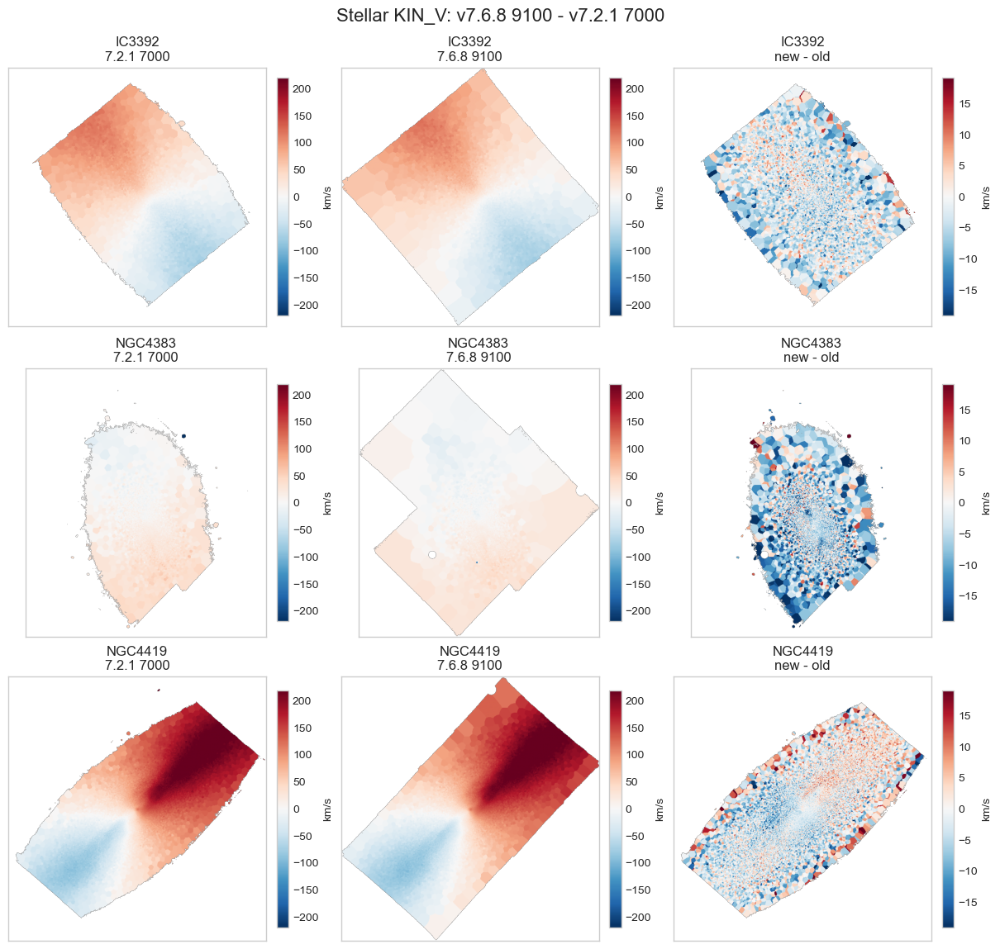

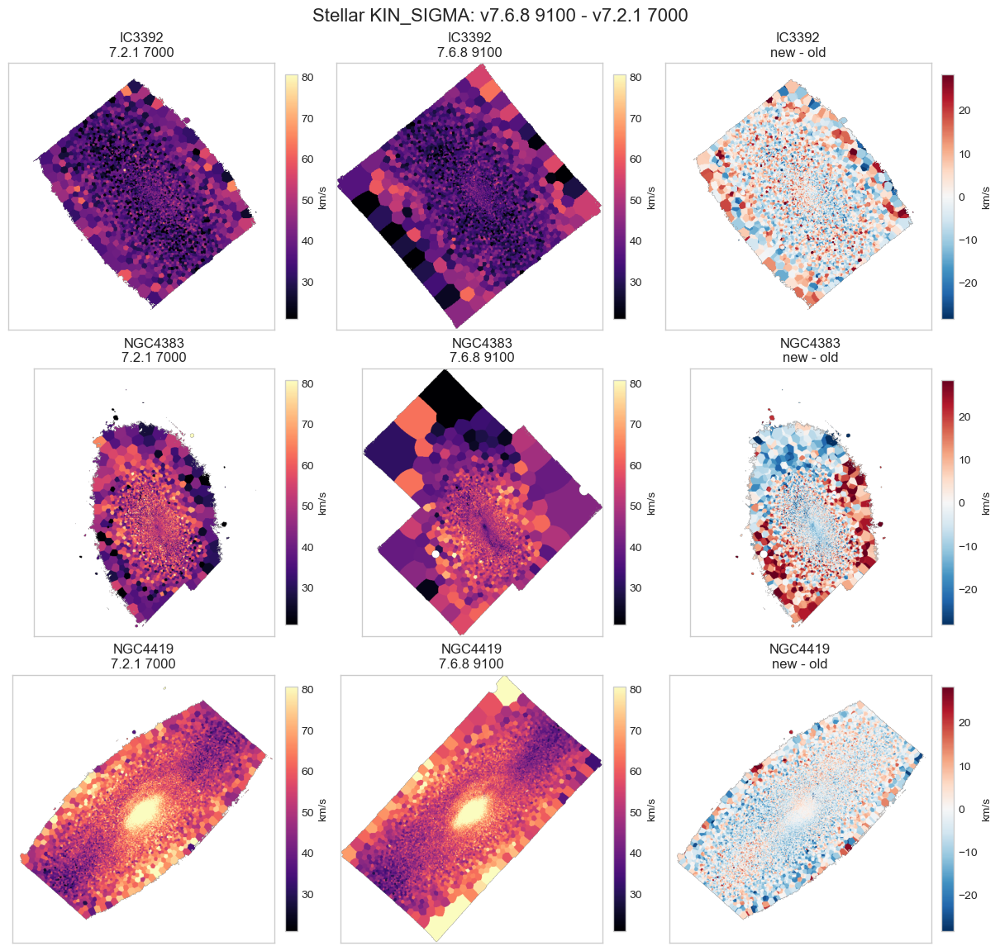

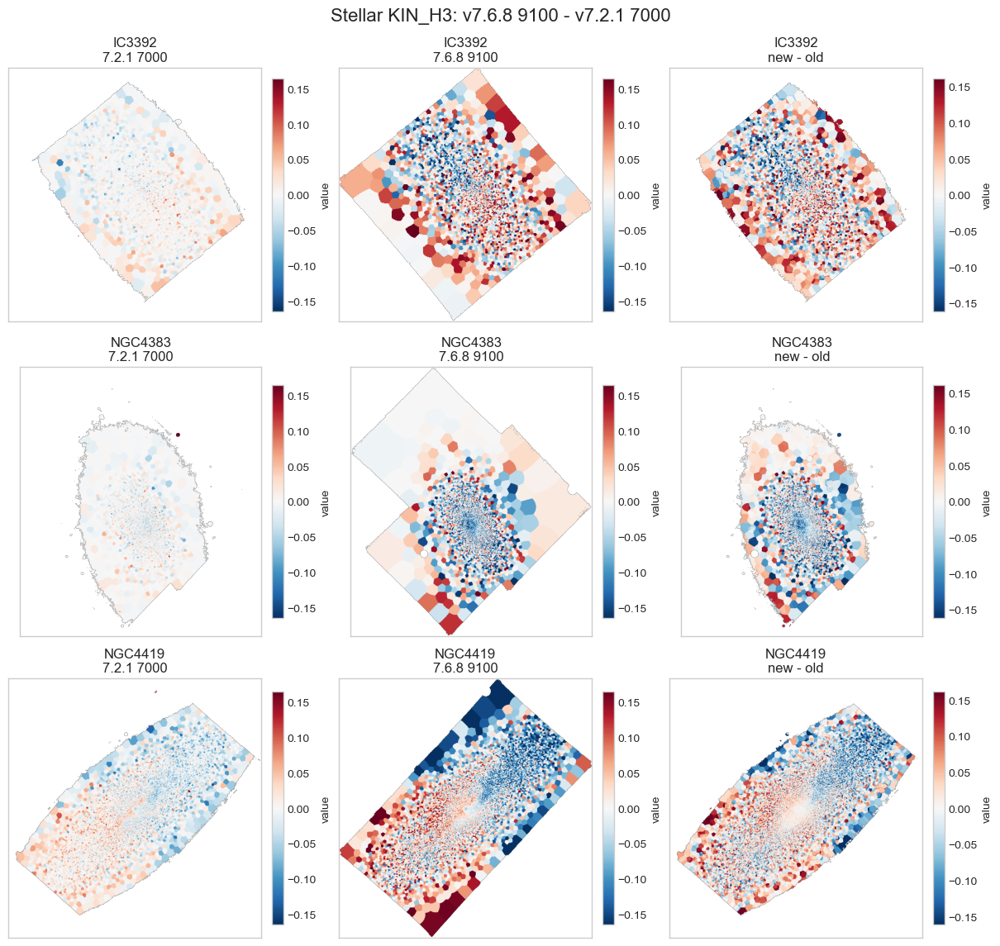

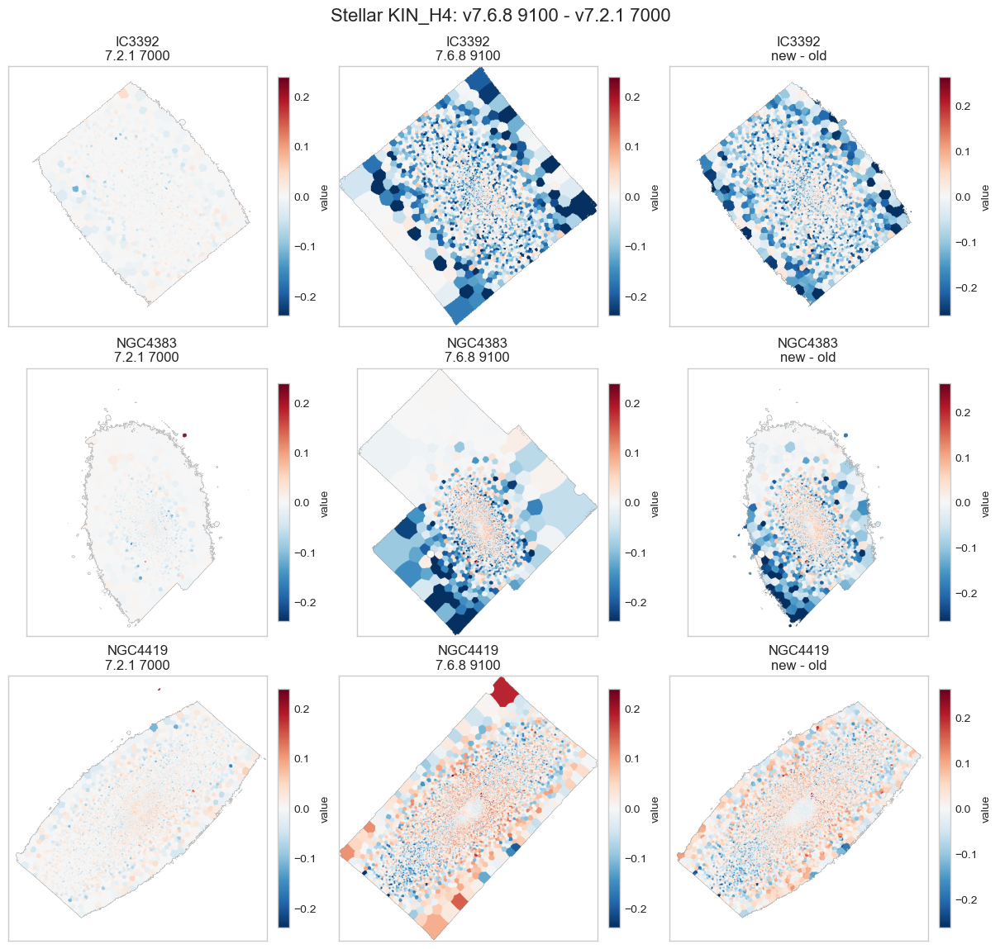

In [7]:
def plot_stellar_map_grid(quantity):
    old_maps = [kin_maps[galaxy][quantity][BASELINE_RUN] for galaxy in GALAXIES]
    new_maps = [kin_maps[galaxy][quantity][COMPARE_RUN] for galaxy in GALAXIES]
    diff_maps = [new - old for old, new in zip(old_maps, new_maps)]

    main_values = finite_values(old_maps + new_maps)
    diff_values = finite_values(diff_maps)
    main_kwargs = {'origin': 'lower', 'cmap': 'RdBu_r' if quantity in KIN_CENTERED else 'magma'}
    if quantity in KIN_CENTERED:
        limit = robust_symmetric_limit(main_values, percentile=98, fallback=1.0)
        main_kwargs['norm'] = TwoSlopeNorm(vmin=-limit, vcenter=0.0, vmax=limit)
    else:
        main_kwargs['vmin'], main_kwargs['vmax'] = robust_limits(main_values)
    diff_limit = robust_symmetric_limit(diff_values, percentile=98, fallback=1.0)
    diff_norm = TwoSlopeNorm(vmin=-diff_limit, vcenter=0.0, vmax=diff_limit)

    fig, axes = plt.subplots(len(GALAXIES), 3, figsize=(12.0, 3.8 * len(GALAXIES)), squeeze=False, constrained_layout=True)
    fig.suptitle(f'Stellar KIN_{quantity}: v7.6.8 9100 - v7.2.1 7000', fontsize=16)
    for row, galaxy in enumerate(GALAXIES):
        panels = [
            (RUNS[galaxy][BASELINE_RUN]['plot_label'], old_maps[row], main_kwargs),
            (RUNS[galaxy][COMPARE_RUN]['plot_label'], new_maps[row], main_kwargs),
            ('new - old', diff_maps[row], {'origin': 'lower', 'cmap': 'RdBu_r', 'norm': diff_norm}),
        ]
        for col, (title, arr, kwargs) in enumerate(panels):
            ax = axes[row, col]
            im = ax.imshow(arr, **kwargs)
            ax.set_title(f'{galaxy}\n{title}')
            ax.set_xticks([]); ax.set_yticks([])
            cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            cbar.set_label('km/s' if quantity in {'V', 'SIGMA'} else 'value')
    plt.show()

for quantity in KIN_QUANTITIES:
    plot_stellar_map_grid(quantity)


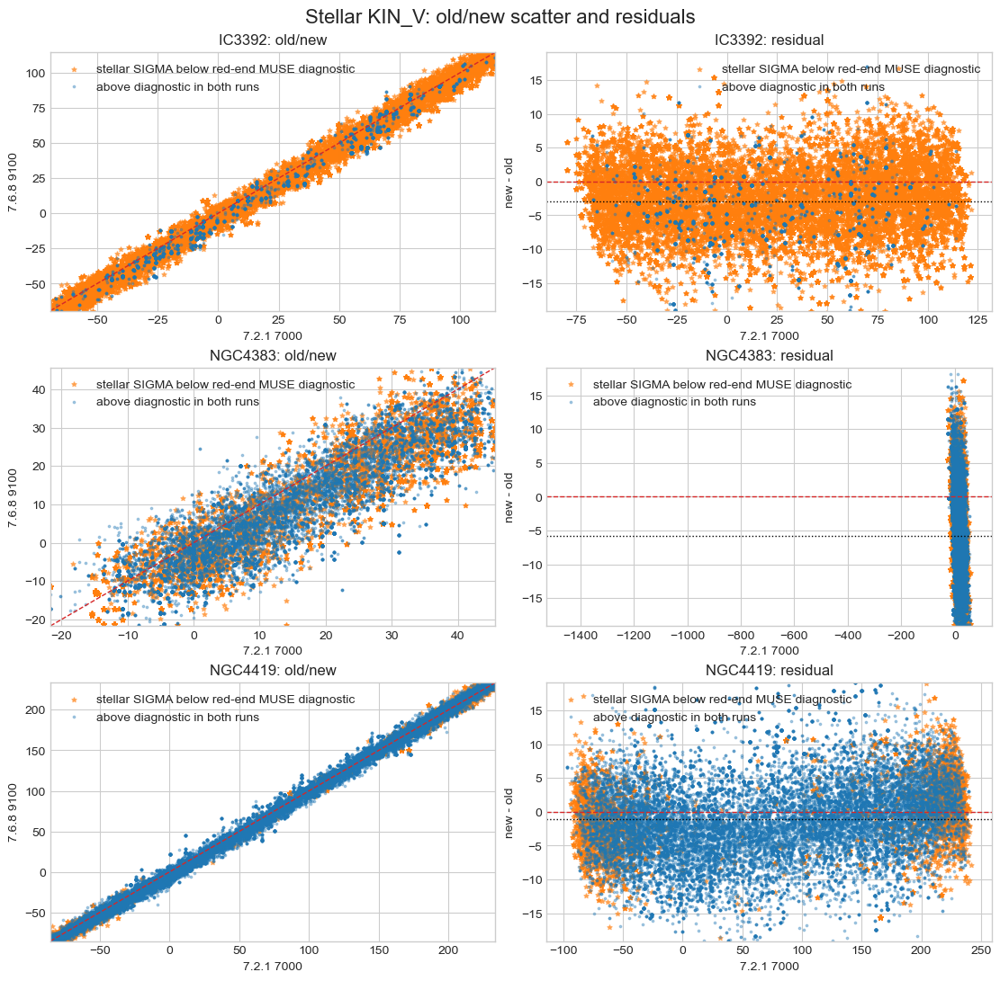

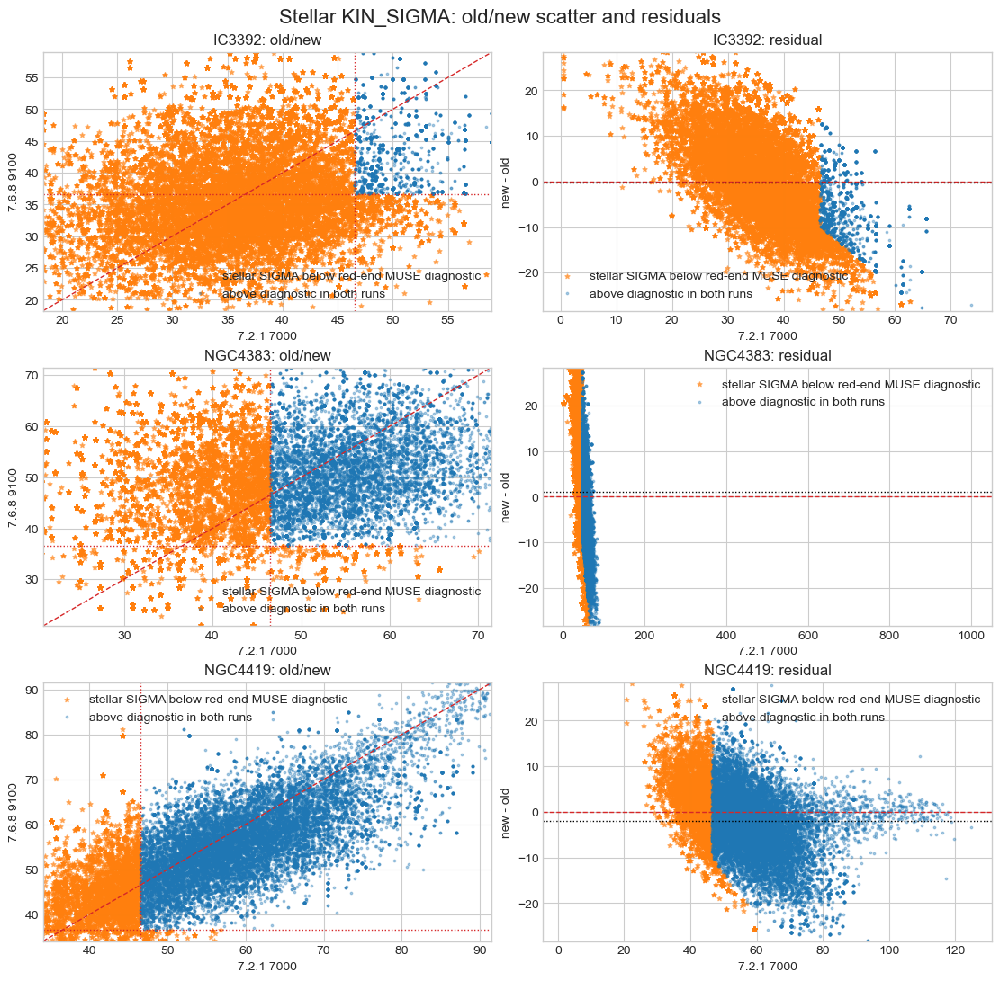

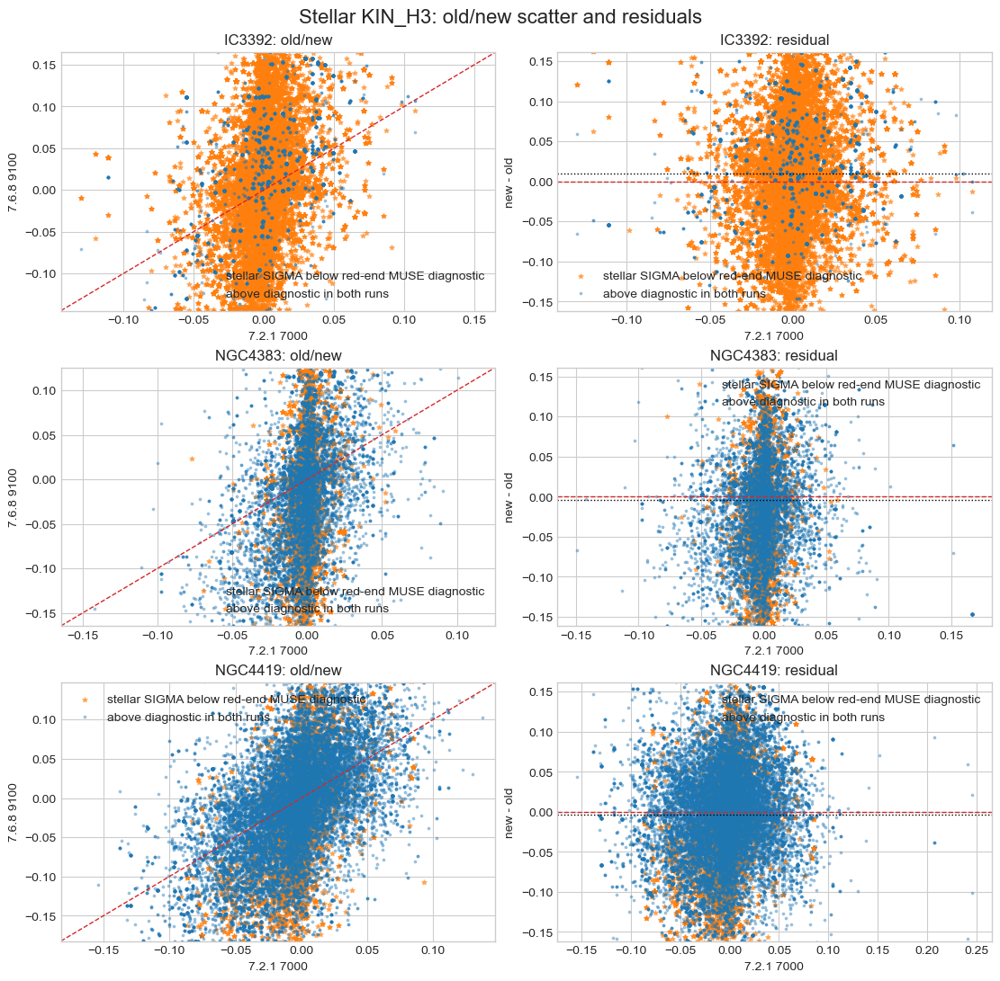

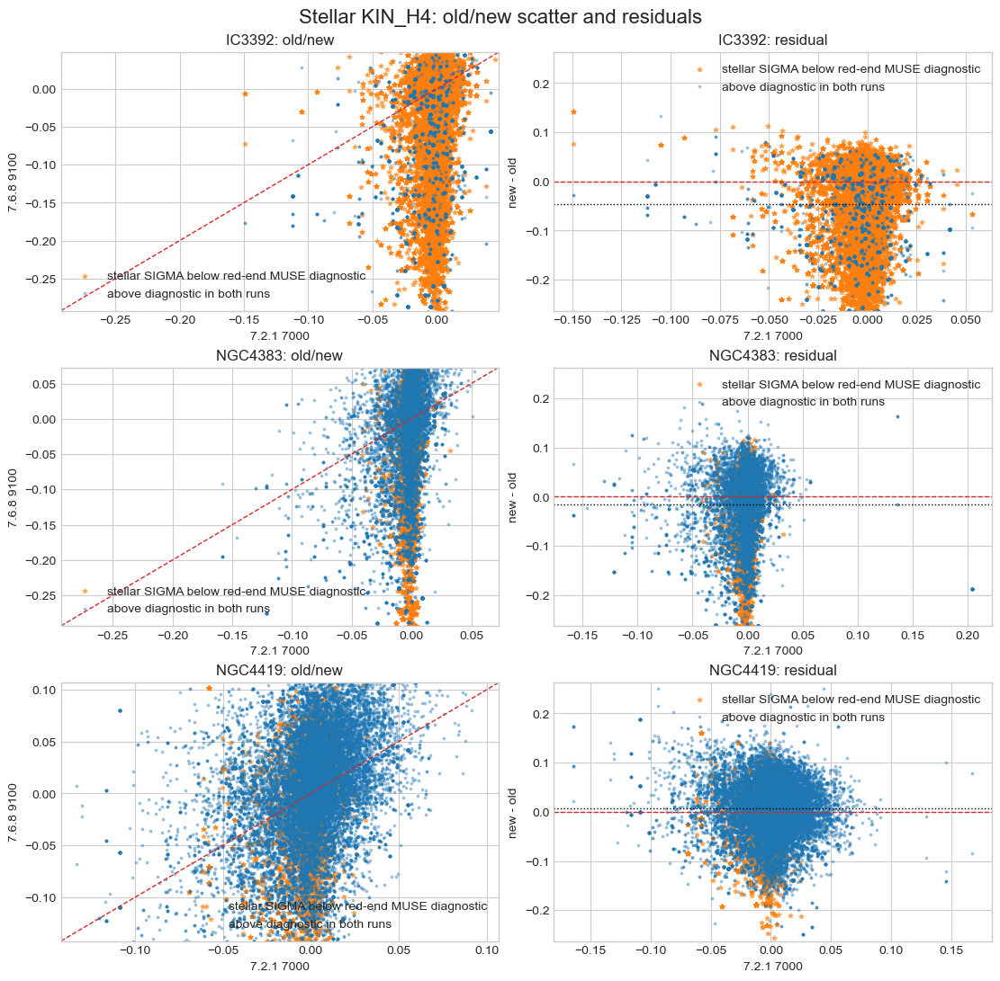

In [8]:
def plot_stellar_scatter(quantity, max_points=MAX_SCATTER_POINTS, random_state=4):
    rng = np.random.default_rng(random_state)
    fig, axes = plt.subplots(len(GALAXIES), 2, figsize=(11.0, 3.6 * len(GALAXIES)), squeeze=False, constrained_layout=True)
    fig.suptitle(f'Stellar KIN_{quantity}: old/new scatter and residuals', fontsize=16)

    all_deltas = []
    for galaxy in GALAXIES:
        old_map = kin_maps[galaxy][quantity][BASELINE_RUN]
        new_map = kin_maps[galaxy][quantity][COMPARE_RUN]
        all_deltas.append(new_map - old_map)
    dlim = robust_symmetric_limit(finite_values(all_deltas), percentile=98, fallback=1.0)

    for row, galaxy in enumerate(GALAXIES):
        old_map = kin_maps[galaxy][quantity][BASELINE_RUN]
        new_map = kin_maps[galaxy][quantity][COMPARE_RUN]
        sigma_finite = np.isfinite(kin_maps[galaxy]['SIGMA'][BASELINE_RUN]) & np.isfinite(kin_maps[galaxy]['SIGMA'][COMPARE_RUN])
        finite = np.isfinite(old_map) & np.isfinite(new_map) & sigma_finite
        below = stellar_below_inst_mask(galaxy)
        idx = np.flatnonzero(finite)
        if idx.size > max_points:
            idx = rng.choice(idx, size=max_points, replace=False)
        old_vals = old_map.ravel()[idx]
        new_vals = new_map.ravel()[idx]
        delta_vals = new_vals - old_vals
        below_vals = below.ravel()[idx]
        lo, hi = robust_limits(np.r_[old_map[finite], new_map[finite]], p=(1, 99))

        for ax, yvals, ylabel, title in [
            (axes[row, 0], new_vals, RUNS[galaxy][COMPARE_RUN]['plot_label'], 'old/new'),
            (axes[row, 1], delta_vals, 'new - old', 'residual'),
        ]:
            ax.scatter(old_vals[below_vals], yvals[below_vals], s=14, color='tab:orange', marker='*', alpha=0.55, label='stellar SIGMA below red-end MUSE diagnostic')
            ax.scatter(old_vals[~below_vals], yvals[~below_vals], s=3, color='tab:blue', alpha=0.35, label='above diagnostic in both runs')
            old_threshold = stellar_sigma_threshold_for_run(galaxy, BASELINE_RUN)
            new_threshold = stellar_sigma_threshold_for_run(galaxy, COMPARE_RUN)
            if ax is axes[row, 0] and quantity == 'SIGMA':
                ax.axvline(old_threshold, color='tab:red', linestyle=':', linewidth=1)
                ax.axhline(new_threshold, color='tab:red', linestyle=':', linewidth=1)
            ax.set_title(f'{galaxy}: {title}')
            ax.set_xlabel(RUNS[galaxy][BASELINE_RUN]['plot_label'])
            ax.set_ylabel(ylabel)
            if ax is axes[row, 0]:
                ax.plot([lo, hi], [lo, hi], color='tab:red', linestyle='--', linewidth=1)
                ax.set_xlim(lo, hi); ax.set_ylim(lo, hi)
            else:
                ax.axhline(0.0, color='tab:red', linestyle='--', linewidth=1)
                ax.axhline(np.nanmedian((new_map - old_map)[finite]), color='black', linestyle=':', linewidth=1)
                ax.set_ylim(-dlim, dlim)
            ax.legend(loc='best')
    plt.show()

for quantity in KIN_QUANTITIES:
    plot_stellar_scatter(quantity)


## Line Flux/Err ratio and GAS instrumental dispersion

`Flux/Err` is computed from the fitted line flux and fitted flux error in each run. Pairwise line summaries use the lower `Flux/Err` value from the two runs.

For GAS dispersion, `_SIGMA_CORR` is read directly from the GAS products. In this stage the GAS `SIGMA` comparisons use observed `SIGMA`; `_SIGMA_CORR` is used only to flag observed `SIGMA < SIGMA_CORR`.


In [9]:
def flux_err_ratio(galaxy, line, run_key):
    flux = gas_maps[galaxy][f'{line}_FLUX'][run_key]
    flux_err = gas_maps[galaxy][f'{line}_FLUX_ERR'][run_key]
    ratio = np.full(flux.shape, np.nan, dtype=float)
    mask = np.isfinite(flux) & np.isfinite(flux_err) & (flux_err > 0)
    ratio[mask] = flux[mask] / flux_err[mask]
    return ratio


def pair_flux_err_ratio(galaxy, line):
    old_ratio = flux_err_ratio(galaxy, line, BASELINE_RUN)
    new_ratio = flux_err_ratio(galaxy, line, COMPARE_RUN)
    return np.fmin(old_ratio, new_ratio)


def pair_flux_err_ratio_mask(galaxy, line, minimum=LINE_FLUX_ERR_RATIO_MIN):
    ratio = pair_flux_err_ratio(galaxy, line)
    return np.isfinite(ratio) & (ratio >= minimum)


def gas_sigma_below_corr_mask(galaxy, line):
    old_sigma = gas_maps[galaxy][f'{line}_SIGMA'][BASELINE_RUN]
    new_sigma = gas_maps[galaxy][f'{line}_SIGMA'][COMPARE_RUN]
    old_corr = gas_maps[galaxy][f'{line}_SIGMA_CORR'][BASELINE_RUN]
    new_corr = gas_maps[galaxy][f'{line}_SIGMA_CORR'][COMPARE_RUN]
    finite = np.isfinite(old_sigma) & np.isfinite(new_sigma) & np.isfinite(old_corr) & np.isfinite(new_corr)
    return finite & ((old_sigma < old_corr) | (new_sigma < new_corr))


def gas_kinematic_flag_mask(galaxy, line):
    ratio = pair_flux_err_ratio(galaxy, line)
    low_ratio = ~np.isfinite(ratio) | (ratio < LINE_FLUX_ERR_RATIO_MIN)
    low_sigma = gas_sigma_below_corr_mask(galaxy, line)
    return low_ratio | low_sigma


def gas_kinematic_good_mask(galaxy, line):
    return ~gas_kinematic_flag_mask(galaxy, line)

flux_ratio_rows = []
for galaxy in GALAXIES:
    for run_key in RUN_ORDER:
        for line in GAS_LINES:
            ratio = flux_err_ratio(galaxy, line, run_key)
            finite = np.isfinite(ratio)
            flux_ratio_rows.append({
                'galaxy': galaxy,
                'run_key': run_key,
                'line': line,
                'n_ratio_finite': int(finite.sum()),
                'n_ratio_ge_cut': int((finite & (ratio >= LINE_FLUX_ERR_RATIO_MIN)).sum()),
                'fraction_ratio_ge_cut': float((finite & (ratio >= LINE_FLUX_ERR_RATIO_MIN)).sum() / finite.sum()) if finite.sum() else np.nan,
                'median_flux_err_ratio': float(np.nanmedian(ratio[finite])) if finite.sum() else np.nan,
                'p16_flux_err_ratio': float(np.nanpercentile(ratio[finite], 16)) if finite.sum() else np.nan,
                'p84_flux_err_ratio': float(np.nanpercentile(ratio[finite], 84)) if finite.sum() else np.nan,
            })
flux_err_ratio_summary = pd.DataFrame(flux_ratio_rows)
display(flux_err_ratio_summary)

sigma_corr_rows = []
flag_rows = []
for galaxy in GALAXIES:
    for line in GAS_LINES:
        flagged = gas_kinematic_flag_mask(galaxy, line)
        finite_pair = np.isfinite(gas_maps[galaxy][f'{line}_VEL'][BASELINE_RUN]) & np.isfinite(gas_maps[galaxy][f'{line}_VEL'][COMPARE_RUN])
        flag_rows.append({
            'galaxy': galaxy,
            'line': line,
            'n_pair_finite': int(finite_pair.sum()),
            'n_flagged_flux_err_or_sigma_corr': int((flagged & finite_pair).sum()),
            'fraction_flagged': float((flagged & finite_pair).sum() / finite_pair.sum()) if finite_pair.sum() else np.nan,
            'n_flux_err_below_cut': int(((~pair_flux_err_ratio_mask(galaxy, line)) & finite_pair).sum()),
            'n_sigma_obs_below_sigma_corr': int((gas_sigma_below_corr_mask(galaxy, line) & finite_pair).sum()),
        })
    for run_key in RUN_ORDER:
        for line in GAS_LINES:
            corr = gas_maps[galaxy][f'{line}_SIGMA_CORR'][run_key]
            finite = np.isfinite(corr)
            sigma_corr_rows.append({
                'galaxy': galaxy,
                'run_key': run_key,
                'line': line,
                'n_sigma_corr_finite': int(finite.sum()),
                'median_sigma_corr_kms': float(np.nanmedian(corr[finite])) if finite.sum() else np.nan,
                'p16_sigma_corr_kms': float(np.nanpercentile(corr[finite], 16)) if finite.sum() else np.nan,
                'p84_sigma_corr_kms': float(np.nanpercentile(corr[finite], 84)) if finite.sum() else np.nan,
                'max_sigma_corr_kms': float(np.nanmax(corr[finite])) if finite.sum() else np.nan,
            })

gas_sigma_corr_summary = pd.DataFrame(sigma_corr_rows)
gas_kinematic_flag_summary = pd.DataFrame(flag_rows)
display(gas_sigma_corr_summary)
display(gas_kinematic_flag_summary)

for _, row in gas_sigma_corr_summary.iterrows():
    print(
        f"{row['galaxy']} {row['run_key']} {row['line']}: GAS sigma_corr median = "
        f"{row['median_sigma_corr_kms']:.2f} km/s; max = {row['max_sigma_corr_kms']:.2f} km/s"
    )


,galaxy,run_key,line,n_ratio_finite,n_ratio_ge_cut,fraction_ratio_ge_cut,median_flux_err_ratio,p16_flux_err_ratio,p84_flux_err_ratio
0,IC3392,v721_7000,HB4861,73168,54952,0.751039,6.012748,2.012748,23.358574
1,IC3392,v721_7000,HA6562,73168,73168,1.000000,29.059572,19.231432,107.536228
2,IC3392,v721_7000,NII6583,73168,73168,1.000000,31.338364,22.643202,51.056577
3,IC3392,v721_7000,SII6716,73168,73078,0.998770,12.625610,8.394311,24.121173
4,IC3392,v768_9100,HB4861,94543,83233,0.880372,9.654249,3.635933,19.099886
5,IC3392,v768_9100,HA6562,94543,94543,1.000000,31.254712,21.576332,83.328569
6,IC3392,v768_9100,NII6583,94543,94543,1.000000,34.663402,22.831042,52.755715
7,IC3392,v768_9100,SII6716,94543,94476,0.999291,14.315357,9.166017,24.347199
8,NGC4383,v721_7000,HB4861,129210,129124,0.999334,77.562234,39.202553,148.091656
9,NGC4383,v721_7000,HA6562,129210,129124,0.999334,252.848489,133.139989,424.733588


,galaxy,run_key,line,n_sigma_corr_finite,median_sigma_corr_kms,p16_sigma_corr_kms,p84_sigma_corr_kms,max_sigma_corr_kms
0,IC3392,v721_7000,HB4861,73168,65.727426,65.727426,65.727426,65.727426
1,IC3392,v721_7000,HA6562,73168,48.687223,48.687223,48.687223,48.687223
2,IC3392,v721_7000,NII6583,73168,48.534434,48.534434,48.534434,48.534434
3,IC3392,v721_7000,SII6716,73168,47.573420,47.573420,47.573420,47.573420
4,IC3392,v768_9100,HB4861,94543,65.727426,65.727426,65.727426,65.727426
5,IC3392,v768_9100,HA6562,94543,48.687223,48.687223,48.687223,48.687223
6,IC3392,v768_9100,NII6583,94543,48.534434,48.534434,48.534434,48.534434
7,IC3392,v768_9100,SII6716,94543,47.573420,47.573420,47.573420,47.573420
8,NGC4383,v721_7000,HB4861,129210,65.727426,65.727426,65.727426,65.727426
9,NGC4383,v721_7000,HA6562,129210,48.687223,48.687223,48.687223,48.687223


,galaxy,line,n_pair_finite,n_flagged_flux_err_or_sigma_corr,fraction_flagged,n_flux_err_below_cut,n_sigma_obs_below_sigma_corr
0,IC3392,HB4861,72910,21241,0.291332,21241,0
1,IC3392,HA6562,72910,0,0.000000,0,0
2,IC3392,NII6583,72910,0,0.000000,0,0
3,IC3392,SII6716,72910,157,0.002153,157,0
4,NGC4383,HB4861,128879,86,0.000667,86,0
5,NGC4383,HA6562,128879,86,0.000667,86,0
6,NGC4383,NII6583,128879,0,0.000000,0,0
7,NGC4383,SII6716,128879,86,0.000667,86,0
8,NGC4419,HB4861,154244,17108,0.110915,17108,0
9,NGC4419,HA6562,154244,69,0.000447,69,0


IC3392 v721_7000 HB4861: GAS sigma_corr median = 65.73 km/s; max = 65.73 km/s
IC3392 v721_7000 HA6562: GAS sigma_corr median = 48.69 km/s; max = 48.69 km/s
IC3392 v721_7000 NII6583: GAS sigma_corr median = 48.53 km/s; max = 48.53 km/s
IC3392 v721_7000 SII6716: GAS sigma_corr median = 47.57 km/s; max = 47.57 km/s
IC3392 v768_9100 HB4861: GAS sigma_corr median = 65.73 km/s; max = 65.73 km/s
IC3392 v768_9100 HA6562: GAS sigma_corr median = 48.69 km/s; max = 48.69 km/s
IC3392 v768_9100 NII6583: GAS sigma_corr median = 48.53 km/s; max = 48.53 km/s
IC3392 v768_9100 SII6716: GAS sigma_corr median = 47.57 km/s; max = 47.57 km/s
NGC4383 v721_7000 HB4861: GAS sigma_corr median = 65.73 km/s; max = 65.73 km/s
NGC4383 v721_7000 HA6562: GAS sigma_corr median = 48.69 km/s; max = 48.69 km/s
NGC4383 v721_7000 NII6583: GAS sigma_corr median = 48.53 km/s; max = 48.53 km/s
NGC4383 v721_7000 SII6716: GAS sigma_corr median = 47.57 km/s; max = 47.57 km/s
NGC4383 v768_9100 HB4861: GAS sigma_corr median = 65.7

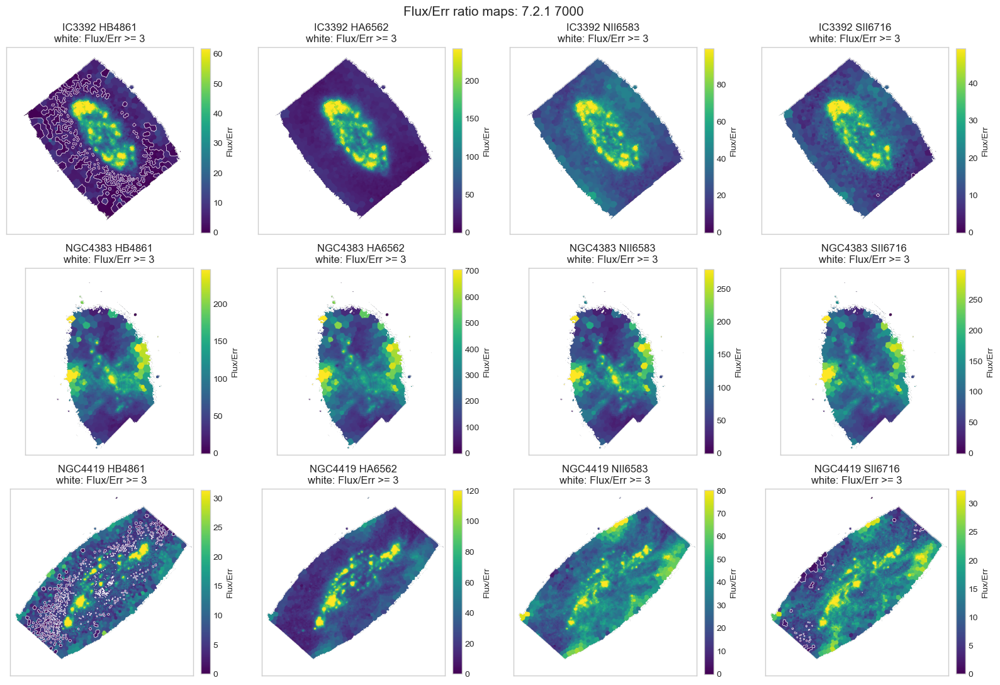

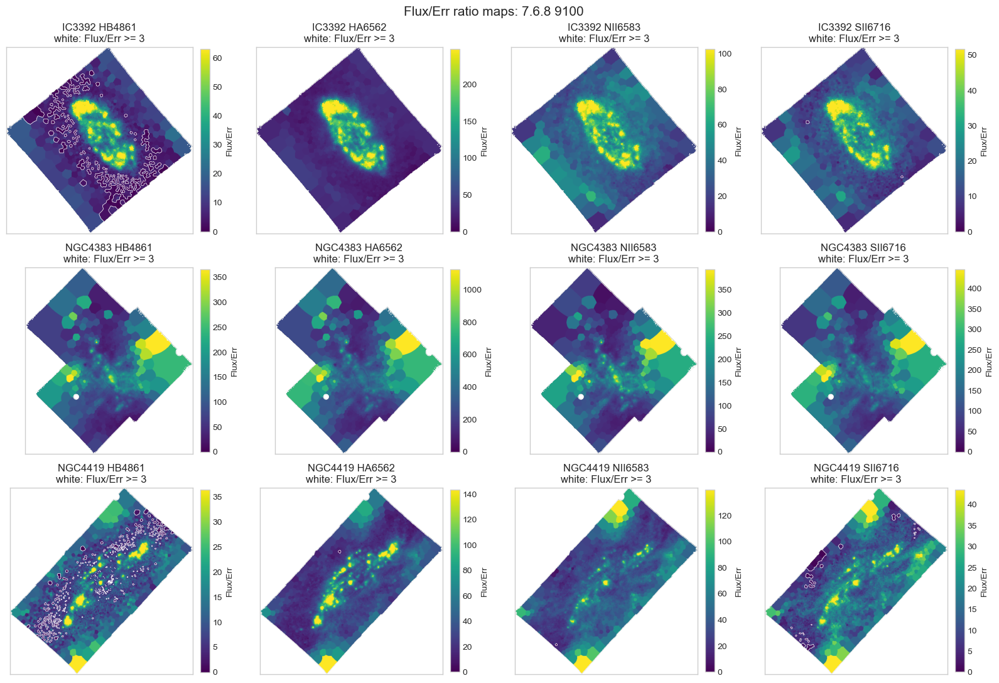

In [10]:
def plot_flux_err_ratio_maps(run_key=COMPARE_RUN):
    fig, axes = plt.subplots(len(GALAXIES), len(GAS_LINES), figsize=(4.0 * len(GAS_LINES), 3.6 * len(GALAXIES)), squeeze=False, constrained_layout=True)
    fig.suptitle(f'Flux/Err ratio maps: {RUNS[GALAXIES[0]][run_key]["plot_label"]}', fontsize=15)
    for row, galaxy in enumerate(GALAXIES):
        for col, line in enumerate(GAS_LINES):
            ratio = flux_err_ratio(galaxy, line, run_key)
            finite = ratio[np.isfinite(ratio) & (ratio > 0)]
            vmax = np.nanpercentile(finite, 98) if finite.size else 10
            ax = axes[row, col]
            im = ax.imshow(ratio, origin='lower', cmap='viridis', vmin=0, vmax=max(vmax, LINE_FLUX_ERR_RATIO_MIN))
            ax.contour(ratio >= LINE_FLUX_ERR_RATIO_MIN, levels=[0.5], colors='white', linewidths=0.5)
            ax.set_title(f'{galaxy} {line}\nwhite: Flux/Err >= {LINE_FLUX_ERR_RATIO_MIN:g}')
            ax.set_xticks([]); ax.set_yticks([])
            fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04).set_label('Flux/Err')
    plt.show()

plot_flux_err_ratio_maps(BASELINE_RUN)
plot_flux_err_ratio_maps(COMPARE_RUN)


## GAS line-property summary

For each line, the table compares `FLUX`, `VEL`, observed `SIGMA`, and `_SIGMA_CORR`. The `good_gas_kinematic` rows exclude pixels with pairwise `Flux/Err < 3` or observed `SIGMA < SIGMA_CORR` in either run. No corrected GAS dispersion is computed in this notebook.


In [11]:
def gas_quantity_map(galaxy, line, quantity, run_key):
    if quantity == 'FLUX':
        return gas_maps[galaxy][f'{line}_FLUX'][run_key]
    if quantity == 'VEL':
        return gas_maps[galaxy][f'{line}_VEL'][run_key]
    if quantity == 'SIGMA':
        return gas_maps[galaxy][f'{line}_SIGMA'][run_key]
    if quantity == 'SIGMA_CORR':
        return gas_maps[galaxy][f'{line}_SIGMA_CORR'][run_key]
    raise ValueError(quantity)


def classify_line_row(row):
    if row['n_used'] == 0:
        return 'no pixels pass this mask'
    if row['mask_name'] == 'all_finite':
        return 'context only; inspect flagged points in plots'
    if row['quantity'] == 'VEL':
        if abs(row['median_delta_new_minus_old']) >= 5 or row['median_abs_delta'] >= 8:
            return 'velocity offset after excluding flagged points'
        if row['rms_delta'] >= 20:
            return 'velocity scatter after excluding flagged points'
        return 'velocity mostly stable after excluding flagged points'
    if row['quantity'] == 'SIGMA':
        if row['median_abs_delta'] >= 8 or row['rms_delta'] >= 20:
            return 'observed sigma differs after excluding flagged points'
        return 'observed sigma mostly stable after excluding flagged points'
    if row['quantity'] == 'SIGMA_CORR':
        return 'instrumental GAS LSF comparison'
    if row['quantity'] == 'FLUX':
        if row['median_abs_pct_change'] >= 20:
            return 'flux differs after Flux/Err cut'
        return 'flux mostly stable after Flux/Err cut'
    return 'inspect visually'

line_rows = []
GAS_COMPARE_QUANTITIES = ['FLUX', 'VEL', 'SIGMA', 'SIGMA_CORR']
for galaxy in GALAXIES:
    for line in GAS_LINES:
        ratio = pair_flux_err_ratio(galaxy, line)
        ratio_mask = pair_flux_err_ratio_mask(galaxy, line)
        good_gas_mask = gas_kinematic_good_mask(galaxy, line)
        for quantity in GAS_COMPARE_QUANTITIES:
            old_map = gas_quantity_map(galaxy, line, quantity, BASELINE_RUN)
            new_map = gas_quantity_map(galaxy, line, quantity, COMPARE_RUN)
            masks = {'all_finite': None}
            if quantity == 'FLUX':
                masks['flux_err_ratio_cut'] = ratio_mask
            elif quantity in {'VEL', 'SIGMA'}:
                masks['good_gas_kinematic'] = good_gas_mask
            elif quantity == 'SIGMA_CORR':
                masks['flux_err_ratio_cut'] = ratio_mask
            for mask_name, mask in masks.items():
                finite_for_ratio = np.isfinite(old_map) & np.isfinite(new_map) & np.isfinite(ratio)
                if mask is not None:
                    finite_for_ratio = finite_for_ratio & mask
                row = {
                    'galaxy': galaxy,
                    'pair_key': PAIR_KEY,
                    'line': line,
                    'quantity': quantity,
                    'mask_name': mask_name,
                    'flux_err_ratio_min': LINE_FLUX_ERR_RATIO_MIN if mask_name in {'flux_err_ratio_cut', 'good_gas_kinematic'} else np.nan,
                    'median_pair_flux_err_ratio_used': float(np.nanmedian(ratio[finite_for_ratio])) if finite_for_ratio.sum() else np.nan,
                }
                row.update(compare_stats(old_map, new_map, mask=mask))
                line_rows.append(row)

line_summary = pd.DataFrame(line_rows)
line_summary['qc_read'] = line_summary.apply(classify_line_row, axis=1)
line_summary = line_summary[
    [
        'galaxy', 'pair_key', 'line', 'quantity', 'mask_name', 'qc_read',
        'flux_err_ratio_min', 'median_pair_flux_err_ratio_used', 'n_all_finite', 'n_used', 'used_fraction_of_finite',
        'pearson_r', 'median_baseline', 'median_compare', 'median_delta_new_minus_old',
        'median_abs_delta', 'p16_delta', 'p84_delta', 'rms_delta', 'median_abs_pct_change', 'rms_pct_change'
    ]
]
display(line_summary)

gas_kinematic_focus = line_summary[(line_summary['quantity'].isin(['VEL', 'SIGMA'])) & (line_summary['mask_name'] == 'good_gas_kinematic')]
display(gas_kinematic_focus.pivot_table(index=['line', 'quantity'], columns='galaxy', values=['median_delta_new_minus_old', 'median_abs_delta', 'rms_delta', 'used_fraction_of_finite']))


,galaxy,pair_key,line,quantity,mask_name,qc_read,flux_err_ratio_min,median_pair_flux_err_ratio_used,n_all_finite,n_used,used_fraction_of_finite,pearson_r,median_baseline,median_compare,median_delta_new_minus_old,median_abs_delta,p16_delta,p84_delta,rms_delta,median_abs_pct_change,rms_pct_change
0,IC3392,v768_9100_minus_v721_7000,HB4861,FLUX,all_finite,context only; inspect flagged points in plots,NaN,5.320604,72910,72910,1.000000,0.989320,10.910049,11.004661,0.667859,3.891523,-6.043891,7.168842,18.948376,25.530279,453.513616
1,IC3392,v768_9100_minus_v721_7000,HB4861,FLUX,flux_err_ratio_cut,flux mostly stable after Flux/Err cut,3.0,7.918002,72910,51669,0.708668,0.988803,15.859602,14.857885,-0.001304,3.889895,-7.282230,7.283303,22.076974,17.608105,38.216578
2,IC3392,v768_9100_minus_v721_7000,HB4861,VEL,all_finite,context only; inspect flagged points in plots,NaN,5.320604,72910,72910,1.000000,0.825049,53.192131,32.629890,-13.092701,13.474214,-26.709975,-6.112763,39.069624,25.961356,328.699646
3,IC3392,v768_9100_minus_v721_7000,HB4861,VEL,good_gas_kinematic,velocity offset after excluding flagged points,3.0,7.918002,72910,51669,0.708668,0.918600,57.999669,36.119205,-12.930445,13.082660,-23.424500,-7.118967,27.087259,25.632645,295.871121
4,IC3392,v768_9100_minus_v721_7000,HB4861,SIGMA,all_finite,context only; inspect flagged points in plots,NaN,5.320604,72910,72910,1.000000,0.774421,89.180787,80.718464,-4.228245,6.873313,-31.414962,1.209282,33.950147,7.004108,20.667720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,NGC4419,v768_9100_minus_v721_7000,SII6716,VEL,good_gas_kinematic,velocity offset after excluding flagged points,3.0,12.680306,154244,149028,0.966183,0.969148,63.401335,49.882034,-13.683975,14.189269,-21.962738,-4.767649,25.095447,20.464642,19129.780447
92,NGC4419,v768_9100_minus_v721_7000,SII6716,SIGMA,all_finite,context only; inspect flagged points in plots,NaN,12.376495,154244,154244,1.000000,0.695340,83.157714,82.844918,-0.474904,4.576517,-8.320754,7.778809,38.290351,5.496375,29.624259
93,NGC4419,v768_9100_minus_v721_7000,SII6716,SIGMA,good_gas_kinematic,observed sigma differs after excluding flagged points,3.0,12.680306,154244,149028,0.966183,0.678696,82.742057,82.205056,-0.506367,4.418969,-7.883906,7.525619,36.459105,5.358697,27.308322
94,NGC4419,v768_9100_minus_v721_7000,SII6716,SIGMA_CORR,all_finite,context only; inspect flagged points in plots,NaN,12.376495,154244,154244,1.000000,1.000000,47.573420,47.573420,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


median_abs_delta                        \
galaxy                     IC3392    NGC4383    NGC4419   
line    quantity                                          
HA6562  SIGMA            7.956620   2.294722   7.990863   
        VEL             13.474214  12.636578  15.449372   
HB4861  SIGMA            4.401875   1.967885   6.753193   
        VEL             13.082660  12.636578  15.276708   
NII6583 SIGMA            3.636637   2.287036   4.537602   
        VEL             14.045270  14.339725  14.294340   
SII6716 SIGMA            3.679988   2.315608   4.418969   
        VEL             14.045270  14.337434  14.189269   

                 median_delta_new_minus_old                        rms_delta  \
galaxy                               IC3392    NGC4383    NGC4419     IC3392   
line    quantity                                                               
HA6562  SIGMA                     -5.065548  -0.193352  -2.589449  35.978316   
        VEL                      -13.092701 -12.489779 -13.986381  39.069624   
HB4861  SIGMA                     -3.082050  -0.162529  -2.272931  33.304665   
        VEL                      -12.930445 -12.489779 -14.020449  27.087259   
NII6583 SIGMA                     -3.244989  -1.391021  -0.471496   8.523056   
        VEL                      -14.028104 -14.267834 -13.692247  18.894825   
SII6716 SIGMA                     -3.277120  -1.404455  -0.506367   8.588778   
        VEL                      -14.028104 -14.270927 -13.683975  18.896128   

                                       used_fraction_of_finite            \
galaxy              NGC4383    NGC4419                  IC3392   NGC4383   
line    quantity                                                           
HA6562  SIGMA      7.961976  54.418437                1.000000  0.999333   
        VEL       14.898204  40.518035                1.000000  0.999333   
HB4861  SIGMA      7.075339  53.121961                0.708668  0.999333   
        VEL       14.898204  40.742085                0.708668  0.999333   
NII6583 SIGMA     24.912188  38.254414                1.000000  1.000000   
        VEL       39.042878  26.233777                1.000000  1.000000   
SII6716 SIGMA      5.397893  36.459105                0.997847  0.999333   
        VEL       16.892651  25.095447                0.997847  0.999333   

                            
galaxy             NGC4419  
line    quantity            
HA6562  SIGMA     0.999553  
        VEL       0.999553  
HB4861  SIGMA     0.889085  
        VEL       0.889085  
NII6583 SIGMA     0.999728  
        VEL       0.999728  
SII6716 SIGMA     0.966183  
        VEL       0.966183

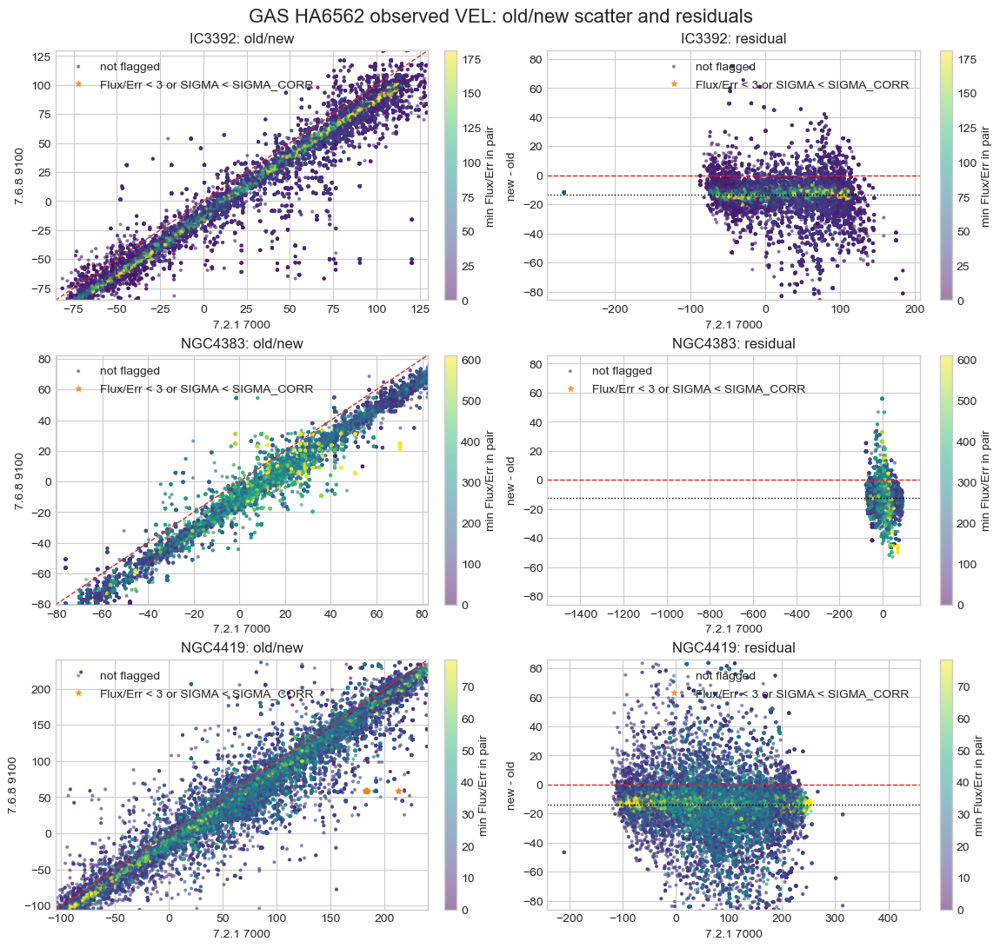

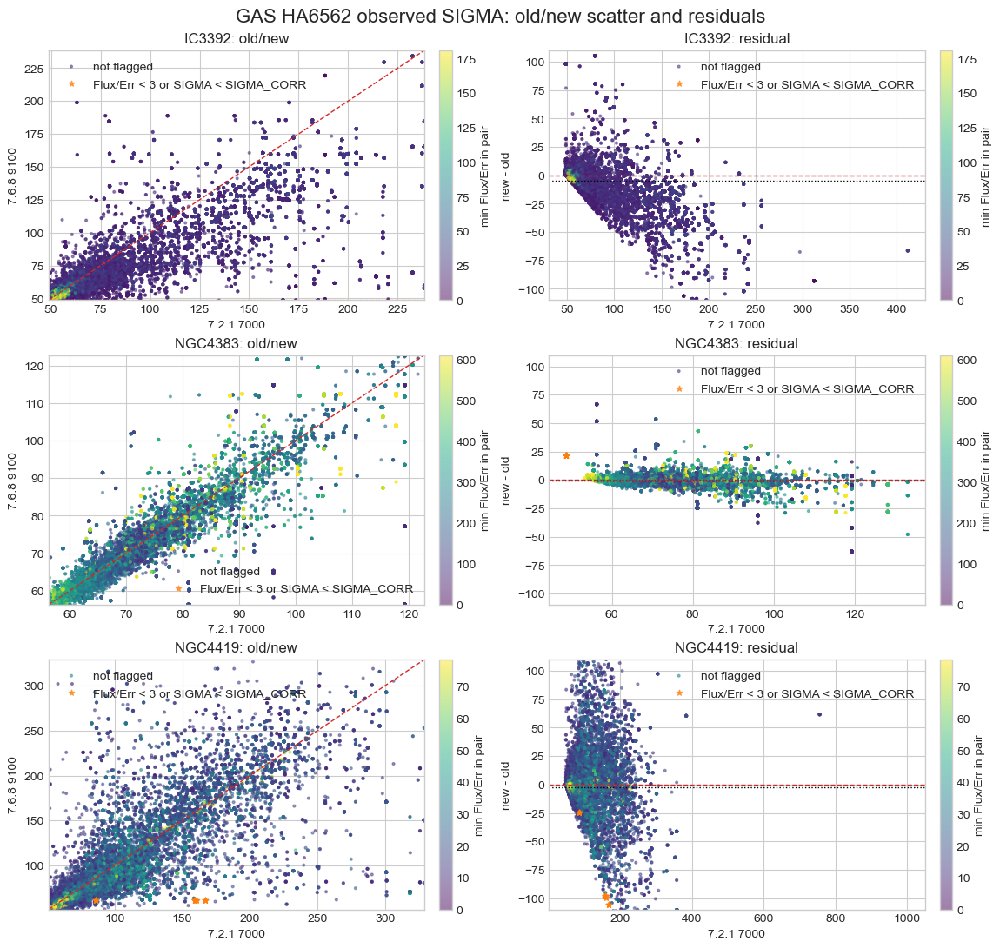

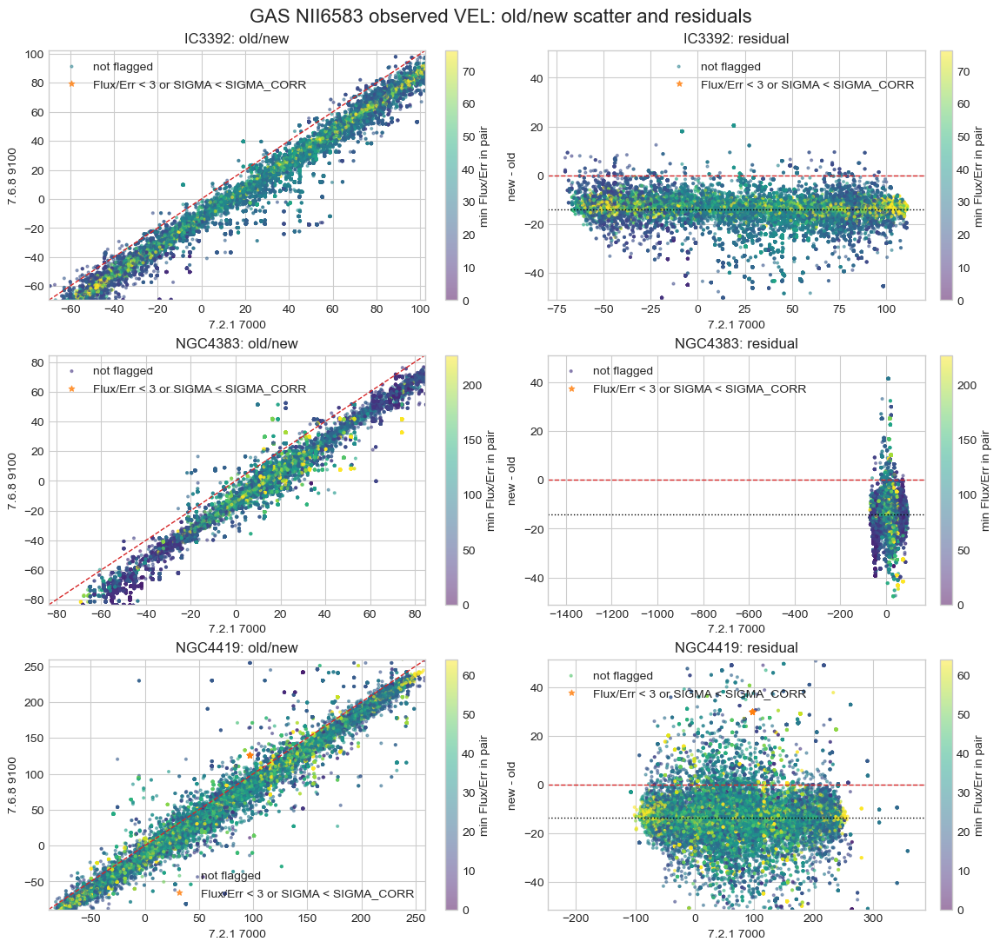

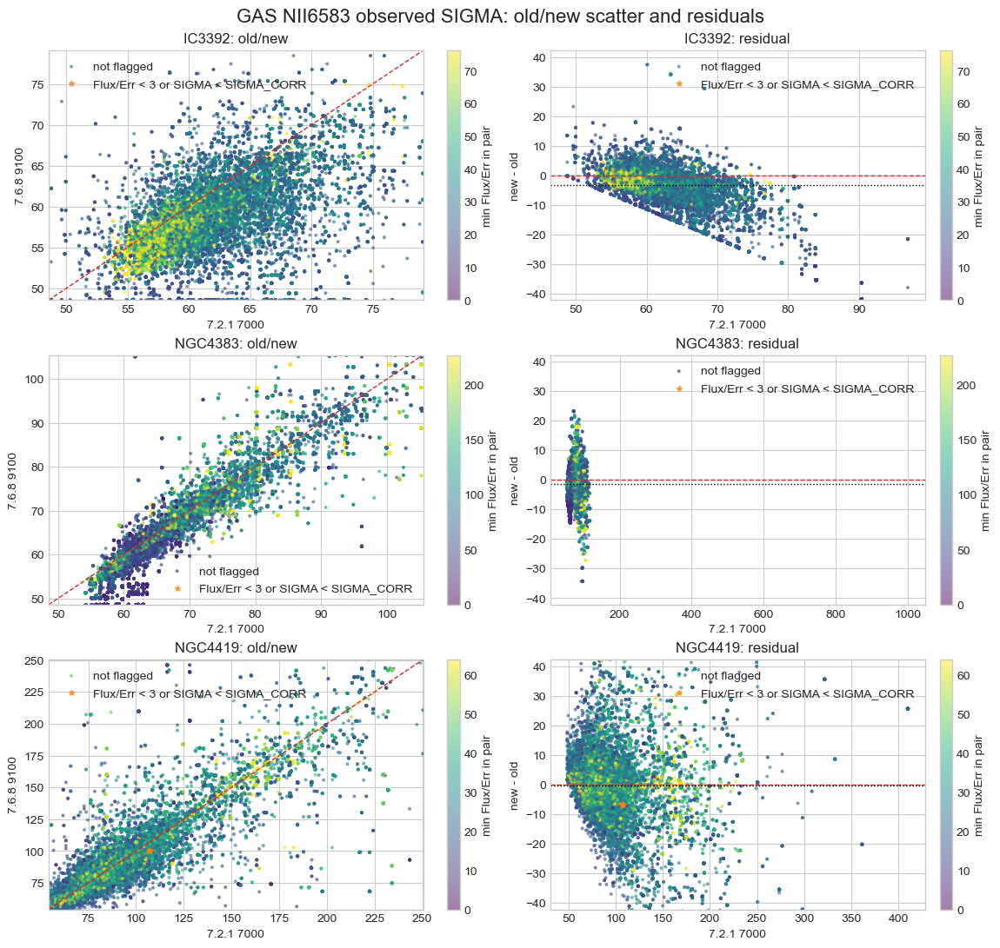

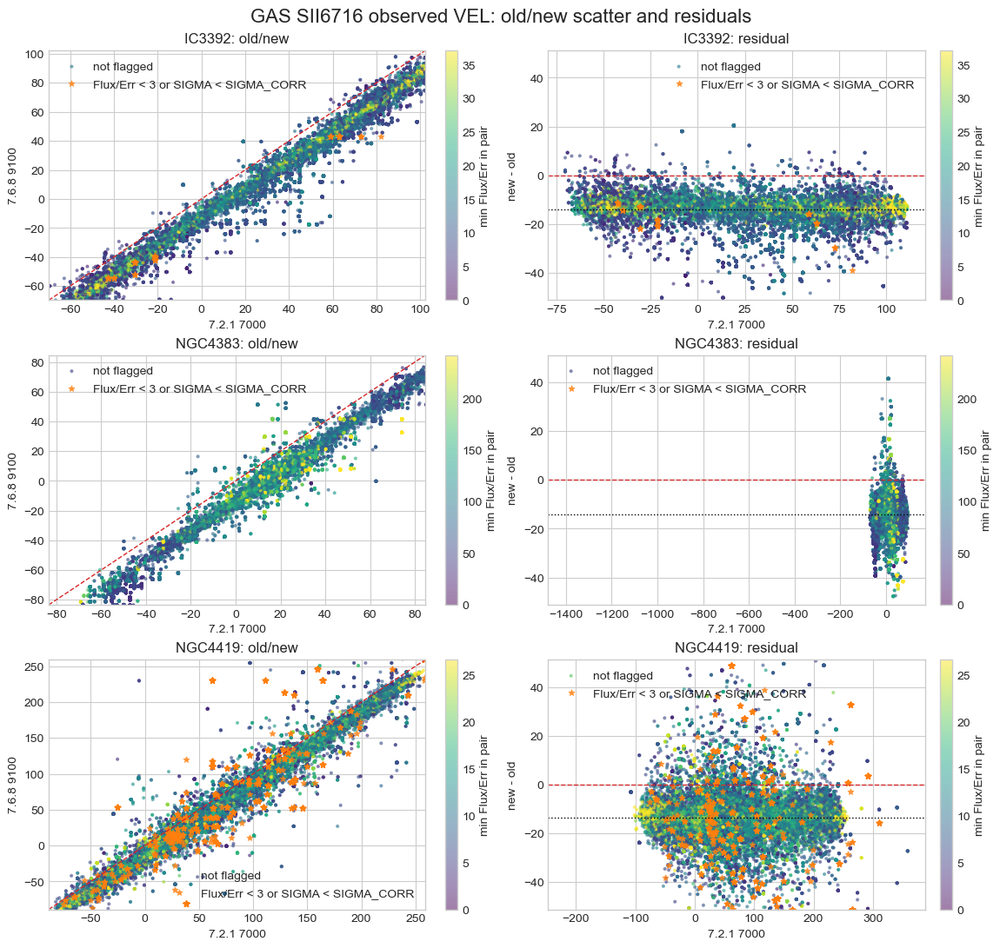

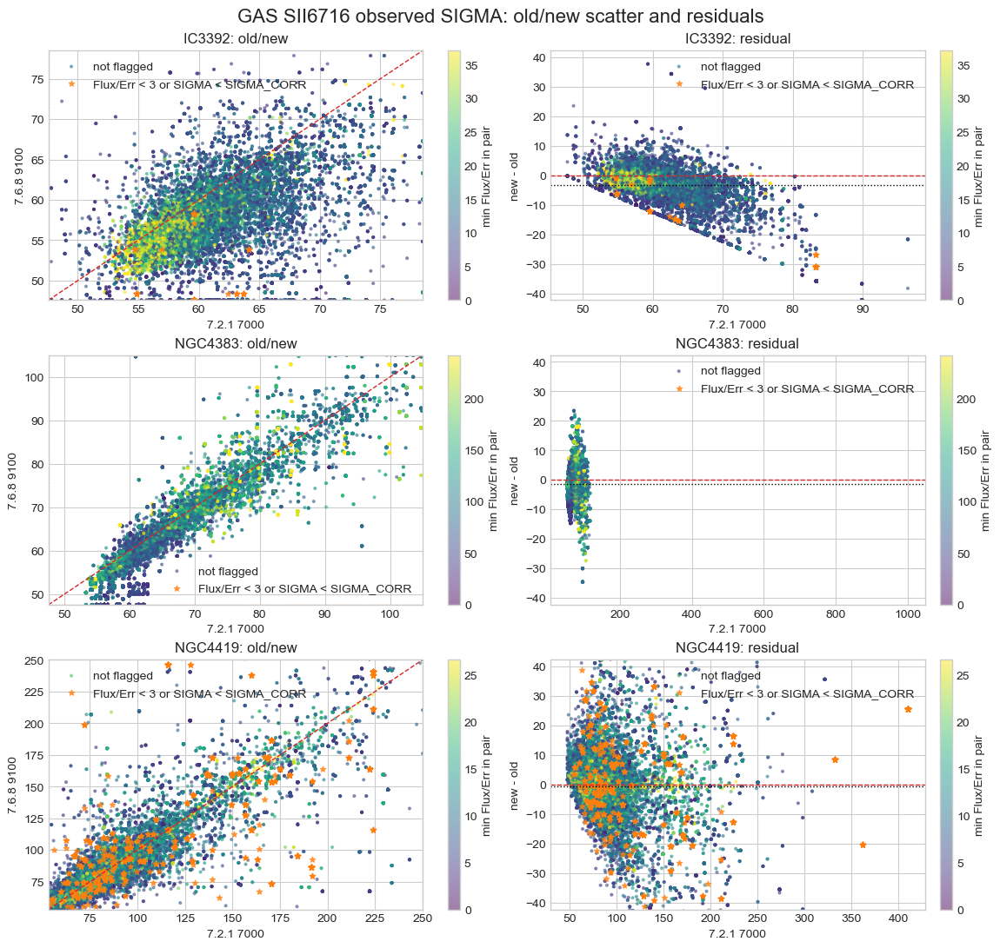

In [12]:
def plot_gas_scatter(line, quantity, max_points=MAX_SCATTER_POINTS, random_state=9):
    rng = np.random.default_rng(random_state)
    fig, axes = plt.subplots(len(GALAXIES), 2, figsize=(11.4, 3.6 * len(GALAXIES)), squeeze=False, constrained_layout=True)
    fig.suptitle(f'GAS {line} observed {quantity}: old/new scatter and residuals', fontsize=16)

    all_deltas = []
    for galaxy in GALAXIES:
        old_map = gas_quantity_map(galaxy, line, quantity, BASELINE_RUN)
        new_map = gas_quantity_map(galaxy, line, quantity, COMPARE_RUN)
        all_deltas.append(new_map - old_map)
    dlim = robust_symmetric_limit(finite_values(all_deltas), percentile=98, fallback=1.0)

    for row, galaxy in enumerate(GALAXIES):
        old_map = gas_quantity_map(galaxy, line, quantity, BASELINE_RUN)
        new_map = gas_quantity_map(galaxy, line, quantity, COMPARE_RUN)
        ratio = pair_flux_err_ratio(galaxy, line)
        flagged = gas_kinematic_flag_mask(galaxy, line)
        finite = np.isfinite(old_map) & np.isfinite(new_map) & np.isfinite(ratio)
        idx = np.flatnonzero(finite)
        if idx.size > max_points:
            idx = rng.choice(idx, size=max_points, replace=False)
        old_vals = old_map.ravel()[idx]
        new_vals = new_map.ravel()[idx]
        delta_vals = new_vals - old_vals
        ratio_vals = ratio.ravel()[idx]
        flag_vals = flagged.ravel()[idx]
        lo, hi = robust_limits(np.r_[old_map[finite], new_map[finite]], p=(1, 99))
        ratio_vmax = max(20, np.nanpercentile(ratio[finite], 95) if finite.sum() else 20)
        norm = Normalize(vmin=0, vmax=ratio_vmax)

        for ax, yvals, ylabel, title in [
            (axes[row, 0], new_vals, RUNS[galaxy][COMPARE_RUN]['plot_label'], 'old/new'),
            (axes[row, 1], delta_vals, 'new - old', 'residual'),
        ]:
            sc = ax.scatter(old_vals[~flag_vals], yvals[~flag_vals], s=4, c=ratio_vals[~flag_vals], cmap='viridis', norm=norm, alpha=0.50, label='not flagged')
            ax.scatter(old_vals[flag_vals], yvals[flag_vals], s=22, color='tab:orange', marker='*', alpha=0.70, label=f'Flux/Err < {LINE_FLUX_ERR_RATIO_MIN:g} or SIGMA < SIGMA_CORR')
            fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.04).set_label('min Flux/Err in pair')
            ax.set_title(f'{galaxy}: {title}')
            ax.set_xlabel(RUNS[galaxy][BASELINE_RUN]['plot_label'])
            ax.set_ylabel(ylabel)
            if ax is axes[row, 0]:
                ax.plot([lo, hi], [lo, hi], color='tab:red', linestyle='--', linewidth=1)
                if quantity == 'SIGMA':
                    old_corr = np.nanmedian(gas_maps[galaxy][f'{line}_SIGMA_CORR'][BASELINE_RUN])
                    new_corr = np.nanmedian(gas_maps[galaxy][f'{line}_SIGMA_CORR'][COMPARE_RUN])
                    ax.axvline(old_corr, color='tab:orange', linestyle=':', linewidth=1)
                    ax.axhline(new_corr, color='tab:orange', linestyle=':', linewidth=1)
                ax.set_xlim(lo, hi); ax.set_ylim(lo, hi)
            else:
                ax.axhline(0.0, color='tab:red', linestyle='--', linewidth=1)
                good = finite & ~flagged
                if good.sum():
                    ax.axhline(np.nanmedian((new_map - old_map)[good]), color='black', linestyle=':', linewidth=1)
                ax.set_ylim(-dlim, dlim)
            ax.legend(loc='best')
    plt.show()

for line in LINE_SCATTER_LINES:
    plot_gas_scatter(line, 'VEL')
    plot_gas_scatter(line, 'SIGMA')


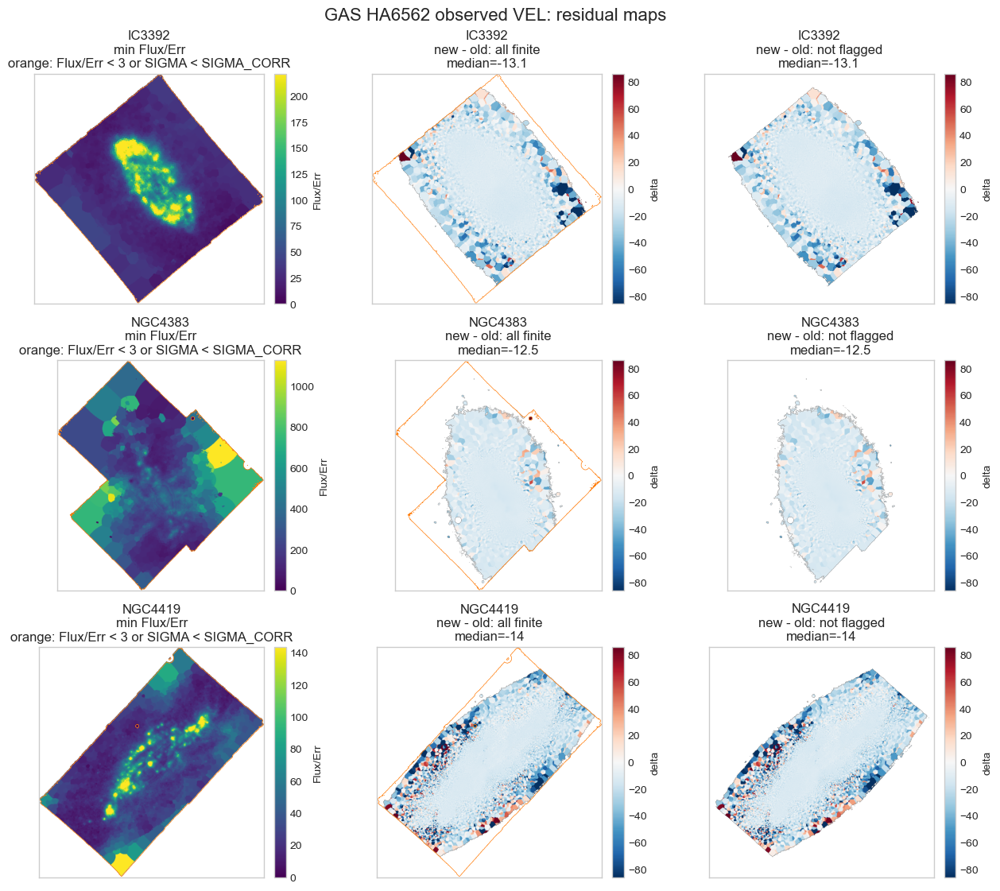

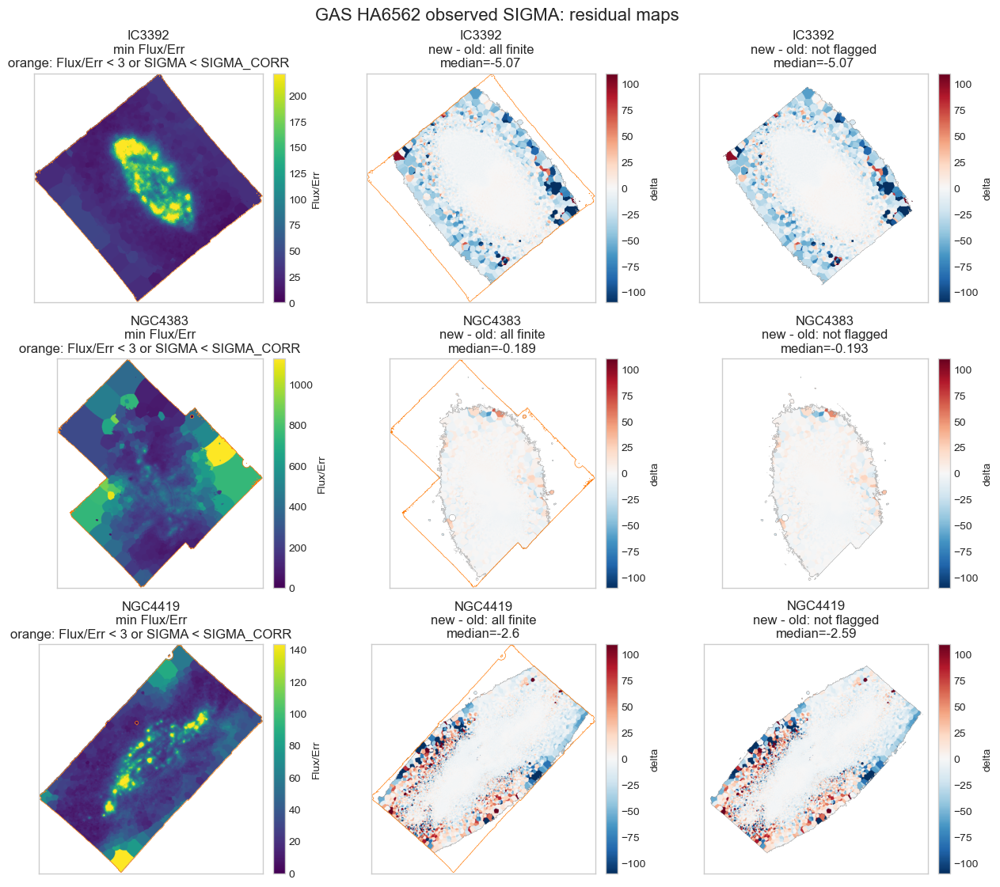

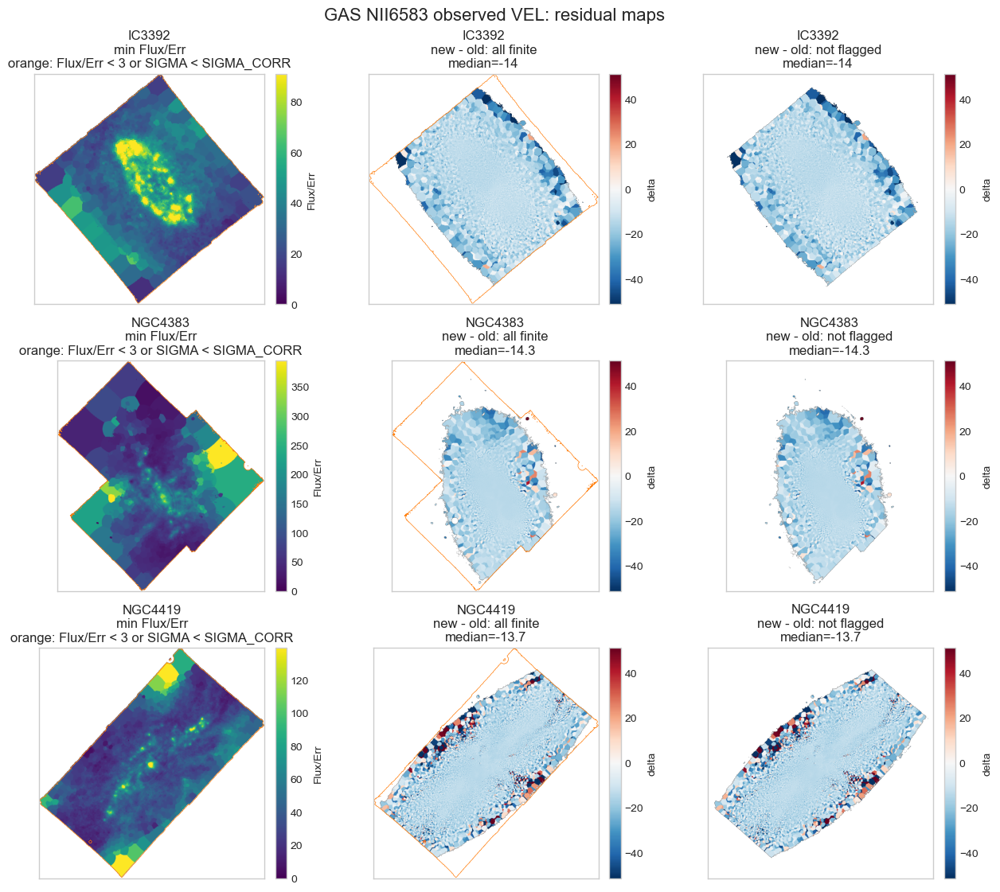

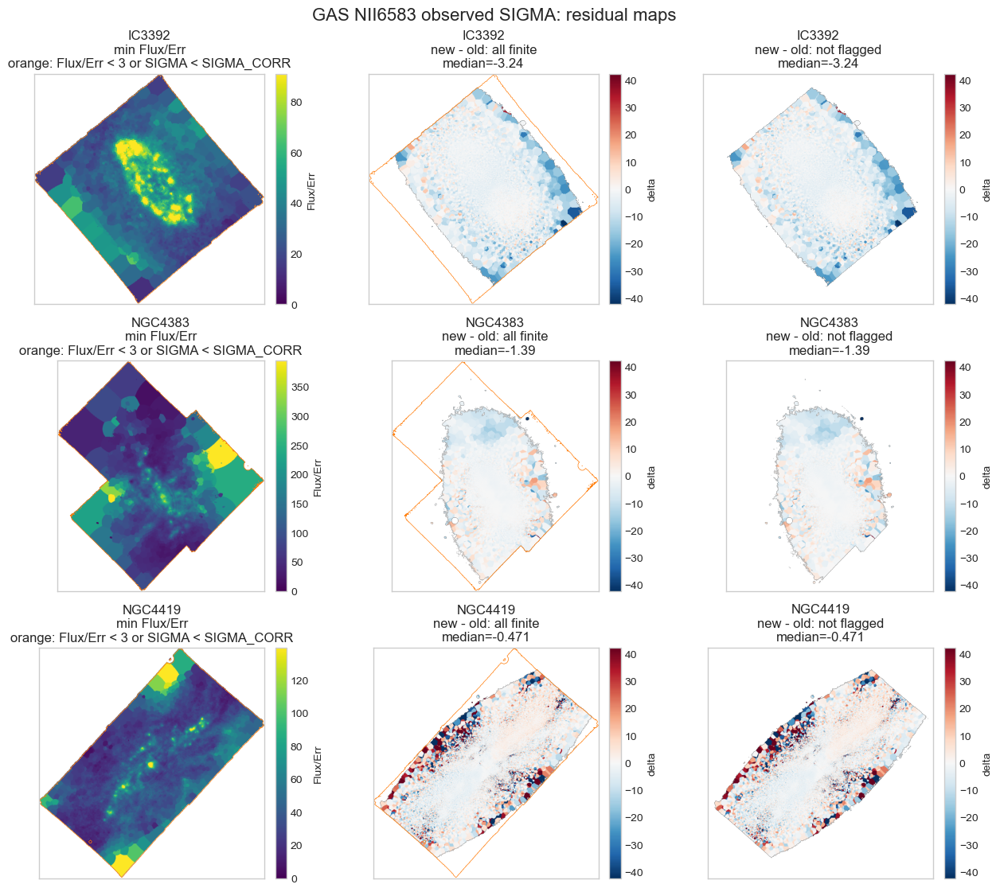

In [13]:
def plot_gas_residual_maps(line, quantity):
    fig, axes = plt.subplots(len(GALAXIES), 3, figsize=(12.6, 3.7 * len(GALAXIES)), squeeze=False, constrained_layout=True)
    fig.suptitle(f'GAS {line} observed {quantity}: residual maps', fontsize=16)

    residuals = []
    for galaxy in GALAXIES:
        old_map = gas_quantity_map(galaxy, line, quantity, BASELINE_RUN)
        new_map = gas_quantity_map(galaxy, line, quantity, COMPARE_RUN)
        residuals.append(new_map - old_map)
    dlim = robust_symmetric_limit(finite_values(residuals), percentile=98, fallback=1.0)
    norm = TwoSlopeNorm(vmin=-dlim, vcenter=0.0, vmax=dlim)

    for row, galaxy in enumerate(GALAXIES):
        old_map = gas_quantity_map(galaxy, line, quantity, BASELINE_RUN)
        new_map = gas_quantity_map(galaxy, line, quantity, COMPARE_RUN)
        ratio = pair_flux_err_ratio(galaxy, line)
        flagged = gas_kinematic_flag_mask(galaxy, line)
        good = ~flagged
        residual = new_map - old_map
        residual_good = np.where(good, residual, np.nan)

        ratio_finite = ratio[np.isfinite(ratio) & (ratio > 0)]
        ratio_vmax = np.nanpercentile(ratio_finite, 98) if ratio_finite.size else 10
        panels = [
            (f'min Flux/Err\norange: Flux/Err < {LINE_FLUX_ERR_RATIO_MIN:g} or SIGMA < SIGMA_CORR', ratio, {'origin': 'lower', 'cmap': 'viridis', 'vmin': 0, 'vmax': max(ratio_vmax, LINE_FLUX_ERR_RATIO_MIN)}, 'Flux/Err'),
            ('new - old: all finite', residual, {'origin': 'lower', 'cmap': 'RdBu_r', 'norm': norm}, 'delta'),
            ('new - old: not flagged', residual_good, {'origin': 'lower', 'cmap': 'RdBu_r', 'norm': norm}, 'delta'),
        ]
        for col, (title, arr, kwargs, cbar_label) in enumerate(panels):
            ax = axes[row, col]
            im = ax.imshow(arr, **kwargs)
            if col in {0, 1}:
                ax.contour(flagged, levels=[0.5], colors='tab:orange', linewidths=0.5)
            vals = arr[np.isfinite(arr)]
            median = np.nanmedian(vals) if vals.size and col > 0 else np.nan
            ax.set_title(f'{galaxy}\n{title}' + (f'\nmedian={median:.3g}' if col > 0 else ''))
            ax.set_xticks([]); ax.set_yticks([])
            fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04).set_label(cbar_label)
    plt.show()

for line in LINE_MAP_LINES:
    plot_gas_residual_maps(line, 'VEL')
    plot_gas_residual_maps(line, 'SIGMA')


## GAS minus stellar velocity residuals

This checks whether the old-new GAS velocity change follows the stellar velocity change. The GAS side excludes points flagged by `Flux/Err < 3` or observed `SIGMA < SIGMA_CORR`.


In [14]:
def gas_minus_stellar_velocity(galaxy, line, run_key):
    gas_v = gas_maps[galaxy][f'{line}_VEL'][run_key]
    stellar_v = kin_maps[galaxy]['V'][run_key]
    pair_good = gas_kinematic_good_mask(galaxy, line)
    mask = np.isfinite(gas_v) & np.isfinite(stellar_v) & pair_good
    out = np.full(gas_v.shape, np.nan, dtype=float)
    out[mask] = gas_v[mask] - stellar_v[mask]
    return out, mask

residual_rows = []
for galaxy in GALAXIES:
    stellar_delta = kin_maps[galaxy]['V'][COMPARE_RUN] - kin_maps[galaxy]['V'][BASELINE_RUN]
    for line in GAS_LINES:
        old_resid, old_mask = gas_minus_stellar_velocity(galaxy, line, BASELINE_RUN)
        new_resid, new_mask = gas_minus_stellar_velocity(galaxy, line, COMPARE_RUN)
        common = old_mask & new_mask
        gas_delta = gas_maps[galaxy][f'{line}_VEL'][COMPARE_RUN] - gas_maps[galaxy][f'{line}_VEL'][BASELINE_RUN]
        resid_delta = new_resid - old_resid
        residual_rows.append({
            'galaxy': galaxy,
            'line': line,
            'n_common_not_flagged': int(common.sum()),
            'median_gas_minus_stellar_old': float(np.nanmedian(old_resid[common])) if common.sum() else np.nan,
            'median_gas_minus_stellar_new': float(np.nanmedian(new_resid[common])) if common.sum() else np.nan,
            'median_delta_gas_minus_stellar': float(np.nanmedian(resid_delta[common])) if common.sum() else np.nan,
            'median_gas_velocity_delta': float(np.nanmedian(gas_delta[common])) if common.sum() else np.nan,
            'median_stellar_velocity_delta': float(np.nanmedian(stellar_delta[common])) if common.sum() else np.nan,
            'rms_delta_gas_minus_stellar': float(np.sqrt(np.nanmean(resid_delta[common]**2))) if common.sum() else np.nan,
        })

gas_stellar_residual_summary = pd.DataFrame(residual_rows)
display(gas_stellar_residual_summary)
display(gas_stellar_residual_summary.pivot_table(index='line', columns='galaxy', values=['median_delta_gas_minus_stellar', 'median_gas_velocity_delta', 'median_stellar_velocity_delta', 'rms_delta_gas_minus_stellar']))


,galaxy,line,n_common_not_flagged,median_gas_minus_stellar_old,median_gas_minus_stellar_new,median_delta_gas_minus_stellar,median_gas_velocity_delta,median_stellar_velocity_delta,rms_delta_gas_minus_stellar
0,IC3392,HB4861,51669,4.953425,-5.734863,-10.766871,-12.930445,-2.992520,25.087322
1,IC3392,HA6562,72910,5.608726,-4.829792,-10.834616,-13.092701,-2.951950,37.899362
2,IC3392,NII6583,72910,4.368837,-7.400879,-12.034475,-14.028104,-2.951950,16.913052
3,IC3392,SII6716,72753,4.345095,-7.412379,-12.035942,-14.028104,-2.951950,16.915237
4,NGC4383,HB4861,128793,-6.899128,-11.139617,-6.683602,-12.489779,-5.753132,12.706475
5,NGC4383,HA6562,128793,-6.899128,-11.139617,-6.683602,-12.489779,-5.753132,12.706475
6,NGC4383,NII6583,128879,-5.713175,-13.827755,-9.141427,-14.267834,-5.749124,14.379180
7,NGC4383,SII6716,128793,-5.757557,-13.810375,-9.132382,-14.270927,-5.753132,14.233451
8,NGC4419,HB4861,137136,7.084922,-6.572150,-13.524164,-14.020449,-1.057857,40.937484
9,NGC4419,HA6562,154175,7.400957,-5.829055,-13.466957,-13.986381,-1.088414,40.677476


median_delta_gas_minus_stellar                       \
galaxy                          IC3392   NGC4383    NGC4419   
line                                                          
HA6562                      -10.834616 -6.683602 -13.466957   
HB4861                      -10.766871 -6.683602 -13.524164   
NII6583                     -12.034475 -9.141427 -12.556635   
SII6716                     -12.035942 -9.132382 -12.544805   

        median_gas_velocity_delta                        \
galaxy                     IC3392    NGC4383    NGC4419   
line                                                      
HA6562                 -13.092701 -12.489779 -13.986381   
HB4861                 -12.930445 -12.489779 -14.020449   
NII6583                -14.028104 -14.267834 -13.692247   
SII6716                -14.028104 -14.270927 -13.683975   

        median_stellar_velocity_delta                      \
galaxy                         IC3392   NGC4383   NGC4419   
line                                                        
HA6562                       -2.95195 -5.753132 -1.088414   
HB4861                       -2.99252 -5.753132 -1.057857   
NII6583                      -2.95195 -5.749124 -1.084384   
SII6716                      -2.95195 -5.753132 -1.037517   

        rms_delta_gas_minus_stellar                        
galaxy                       IC3392    NGC4383    NGC4419  
line                                                       
HA6562                    37.899362  12.706475  40.677476  
HB4861                    25.087322  12.706475  40.937484  
NII6583                   16.913052  14.379180  26.337273  
SII6716                   16.915237  14.233451  25.227401

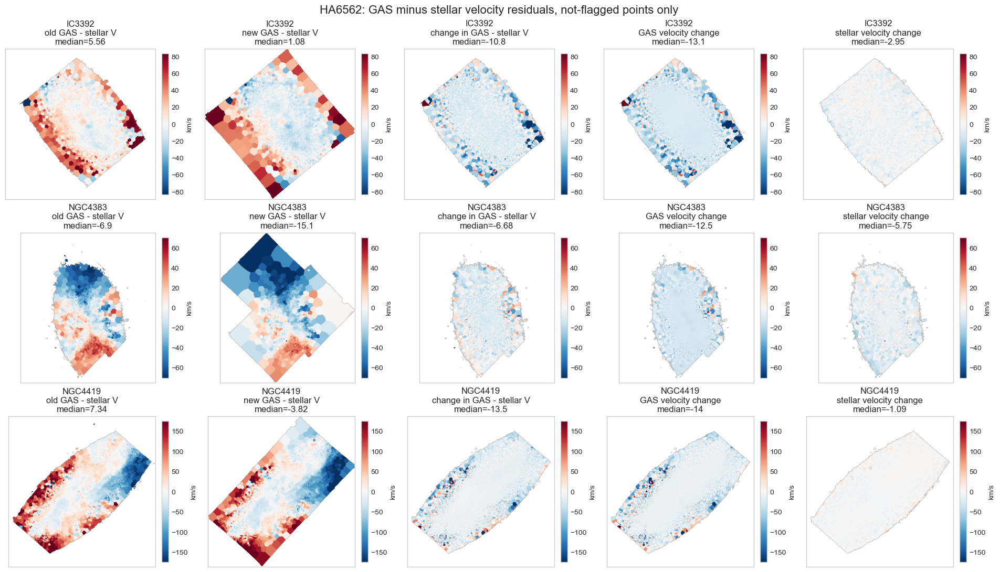

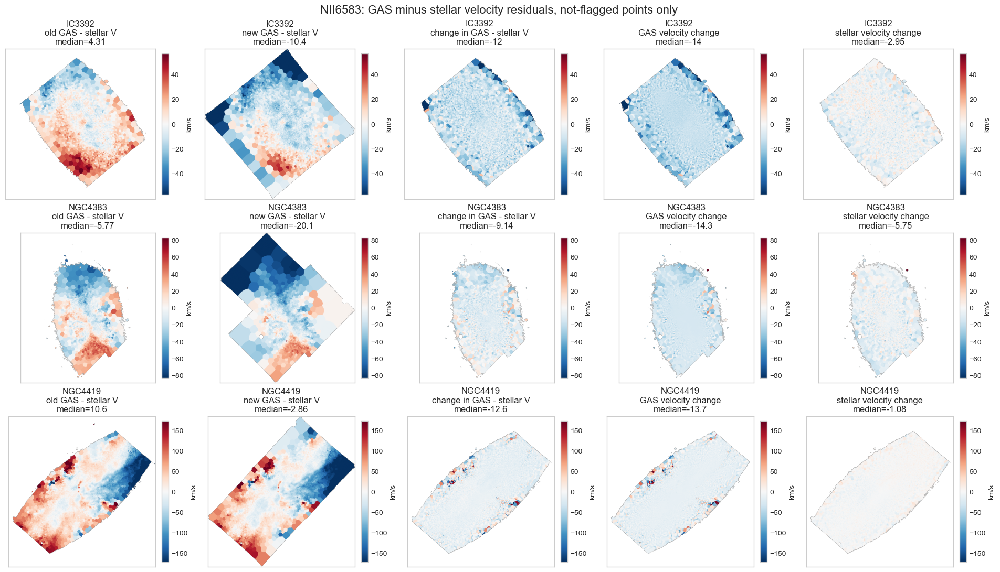

In [15]:
def plot_gas_minus_stellar_maps(line):
    fig, axes = plt.subplots(len(GALAXIES), 5, figsize=(19.0, 3.6 * len(GALAXIES)), squeeze=False, constrained_layout=True)
    fig.suptitle(f'{line}: GAS minus stellar velocity residuals, not-flagged points only', fontsize=16)

    for row, galaxy in enumerate(GALAXIES):
        old_resid, old_mask = gas_minus_stellar_velocity(galaxy, line, BASELINE_RUN)
        new_resid, new_mask = gas_minus_stellar_velocity(galaxy, line, COMPARE_RUN)
        common = old_mask & new_mask
        gas_delta = np.where(common, gas_maps[galaxy][f'{line}_VEL'][COMPARE_RUN] - gas_maps[galaxy][f'{line}_VEL'][BASELINE_RUN], np.nan)
        stellar_delta = np.where(common, kin_maps[galaxy]['V'][COMPARE_RUN] - kin_maps[galaxy]['V'][BASELINE_RUN], np.nan)
        resid_delta = np.where(common, new_resid - old_resid, np.nan)
        dlim = robust_symmetric_limit(finite_values([old_resid, new_resid, resid_delta, gas_delta, stellar_delta]), percentile=98, fallback=1.0)
        norm = TwoSlopeNorm(vmin=-dlim, vcenter=0.0, vmax=dlim)
        panels = [
            ('old GAS - stellar V', old_resid),
            ('new GAS - stellar V', new_resid),
            ('change in GAS - stellar V', resid_delta),
            ('GAS velocity change', gas_delta),
            ('stellar velocity change', stellar_delta),
        ]
        for col, (title, arr) in enumerate(panels):
            ax = axes[row, col]
            im = ax.imshow(arr, origin='lower', cmap='RdBu_r', norm=norm)
            vals = arr[np.isfinite(arr)]
            median = np.nanmedian(vals) if vals.size else np.nan
            ax.set_title(f'{galaxy}\n{title}\nmedian={median:.3g}')
            ax.set_xticks([]); ax.set_yticks([])
            fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04).set_label('km/s')
    plt.show()

for line in LINE_MAP_LINES:
    plot_gas_minus_stellar_maps(line)


## Automatic issue log

This table is a compact checklist for preparing the discussion. It flags comparisons that need a caveat or a plot.


In [16]:
issue_rows = []

for _, row in stellar_summary.iterrows():
    if row['quantity'] in {'KIN_SIGMA', 'KIN_H3', 'KIN_H4'} and row['fraction_below_red_inst'] > 0.95:
        issue_rows.append({
            'severity': 'caveat',
            'area': 'stellar KIN',
            'galaxy': row['galaxy'],
            'tracer': row['quantity'],
            'issue': 'Most stellar SIGMA values are below the run-specific red-end MUSE instrumental-dispersion diagnostic; do not treat this as a hard failure.',
            'evidence': f"red-end scale max={row['stellar_inst_sigma_red_pair_max_kms']:.2f} km/s; fraction_below={row['fraction_below_red_inst']:.4f}",
            'recommended_plot': 'stellar scatter/residual plot with orange diagnostic markers',
        })
    if row['quantity'] == 'KIN_V' and (abs(row['median_delta_new_minus_old']) >= 5 or row['rms_delta'] >= 20):
        issue_rows.append({
            'severity': 'inspect',
            'area': 'stellar velocity',
            'galaxy': row['galaxy'],
            'tracer': row['quantity'],
            'issue': 'Stellar velocity has a notable offset or structured residual.',
            'evidence': f"median={row['median_delta_new_minus_old']:.3g} km/s; rms={row['rms_delta']:.3g} km/s",
            'recommended_plot': 'stellar V residual map and scatter',
        })

line_good = line_summary[line_summary['mask_name'] == 'good_gas_kinematic']
for _, row in line_good.iterrows():
    if row['quantity'] == 'VEL' and (abs(row['median_delta_new_minus_old']) >= 5 or row['median_abs_delta'] >= 8):
        issue_rows.append({
            'severity': 'inspect',
            'area': 'GAS velocity',
            'galaxy': row['galaxy'],
            'tracer': row['line'],
            'issue': 'Line velocity offset remains after excluding orange-star flagged points.',
            'evidence': f"median={row['median_delta_new_minus_old']:.3g} km/s; median_abs={row['median_abs_delta']:.3g} km/s; n={row['n_used']}",
            'recommended_plot': 'orange-star velocity scatter and residual plot',
        })
    if row['quantity'] == 'SIGMA' and (row['median_abs_delta'] >= 8 or row['rms_delta'] >= 20):
        issue_rows.append({
            'severity': 'inspect',
            'area': 'GAS observed sigma',
            'galaxy': row['galaxy'],
            'tracer': row['line'],
            'issue': 'Observed line sigma changes after excluding orange-star flagged points.',
            'evidence': f"median_abs={row['median_abs_delta']:.3g} km/s; rms={row['rms_delta']:.3g} km/s; n={row['n_used']}",
            'recommended_plot': 'orange-star observed sigma scatter and residual plot',
        })

for _, row in gas_kinematic_flag_summary.iterrows():
    if row['fraction_flagged'] > 0.25:
        issue_rows.append({
            'severity': 'caveat',
            'area': 'GAS flagged fraction',
            'galaxy': row['galaxy'],
            'tracer': row['line'],
            'issue': 'Large fraction of GAS kinematic pixels are flagged by Flux/Err or observed SIGMA < SIGMA_CORR.',
            'evidence': f"flagged_fraction={row['fraction_flagged']:.3f}; low Flux/Err={row['n_flux_err_below_cut']}; low sigma={row['n_sigma_obs_below_sigma_corr']}",
            'recommended_plot': 'Flux/Err map and orange-star scatter',
        })

for _, row in gas_stellar_residual_summary.iterrows():
    if abs(row['median_delta_gas_minus_stellar']) >= 5 or row['rms_delta_gas_minus_stellar'] >= 20:
        issue_rows.append({
            'severity': 'inspect',
            'area': 'GAS vs stellar velocity',
            'galaxy': row['galaxy'],
            'tracer': row['line'],
            'issue': 'GAS-minus-stellar velocity residual changes between runs after excluding flagged points.',
            'evidence': f"median_delta={row['median_delta_gas_minus_stellar']:.3g} km/s; rms={row['rms_delta_gas_minus_stellar']:.3g} km/s",
            'recommended_plot': 'GAS-minus-stellar velocity residual maps',
        })

issue_log = pd.DataFrame(issue_rows)
if issue_log.empty:
    print('No automatic issues found with the current thresholds; still inspect the plots.')
else:
    severity_order = {'inspect': 0, 'caveat': 1}
    issue_log['_order'] = issue_log['severity'].map(severity_order).fillna(9)
    issue_log = issue_log.sort_values(['_order', 'area', 'galaxy', 'tracer']).drop(columns='_order').reset_index(drop=True)
    display(issue_log)


,severity,area,galaxy,tracer,issue,evidence,recommended_plot
0,inspect,GAS observed sigma,IC3392,HA6562,Observed line sigma changes after excluding orange-star flagged points.,median_abs=7.96 km/s; rms=36 km/s; n=72910,orange-star observed sigma scatter and residual plot
1,inspect,GAS observed sigma,IC3392,HB4861,Observed line sigma changes after excluding orange-star flagged points.,median_abs=4.4 km/s; rms=33.3 km/s; n=51669,orange-star observed sigma scatter and residual plot
2,inspect,GAS observed sigma,NGC4383,NII6583,Observed line sigma changes after excluding orange-star flagged points.,median_abs=2.29 km/s; rms=24.9 km/s; n=128879,orange-star observed sigma scatter and residual plot
3,inspect,GAS observed sigma,NGC4419,HA6562,Observed line sigma changes after excluding orange-star flagged points.,median_abs=7.99 km/s; rms=54.4 km/s; n=154175,orange-star observed sigma scatter and residual plot
4,inspect,GAS observed sigma,NGC4419,HB4861,Observed line sigma changes after excluding orange-star flagged points.,median_abs=6.75 km/s; rms=53.1 km/s; n=137136,orange-star observed sigma scatter and residual plot
5,inspect,GAS observed sigma,NGC4419,NII6583,Observed line sigma changes after excluding orange-star flagged points.,median_abs=4.54 km/s; rms=38.3 km/s; n=154202,orange-star observed sigma scatter and residual plot
6,inspect,GAS observed sigma,NGC4419,SII6716,Observed line sigma changes after excluding orange-star flagged points.,median_abs=4.42 km/s; rms=36.5 km/s; n=149028,orange-star observed sigma scatter and residual plot
7,inspect,GAS velocity,IC3392,HA6562,Line velocity offset remains after excluding orange-star flagged points.,median=-13.1 km/s; median_abs=13.5 km/s; n=72910,orange-star velocity scatter and residual plot
8,inspect,GAS velocity,IC3392,HB4861,Line velocity offset remains after excluding orange-star flagged points.,median=-12.9 km/s; median_abs=13.1 km/s; n=51669,orange-star velocity scatter and residual plot
9,inspect,GAS velocity,IC3392,NII6583,Line velocity offset remains after excluding orange-star flagged points.,median=-14 km/s; median_abs=14 km/s; n=72910,orange-star velocity scatter and residual plot


## Notes for reporting

- Keep the comparison framed as `v7.6.8 9100-A - v7.2.1 7000-A`; this notebook intentionally does not try to attribute differences to intermediate runs.
- For stellar `SIGMA`, `H3`, and `H4`, quote the red-end MUSE instrumental-dispersion diagnostic printed above only as a caveat. The current plots and tables do not remove those pixels, because doing so would erase almost all IC3392 stellar kinematic information.
- Stellar pairwise scatter/residual plots, including `V`, use orange stars for pixels where stellar `SIGMA` is below the run-specific red-end diagnostic in either run, and blue points for pixels above it in both runs.
- Do not subtract the MUSE instrumental sigma from the stellar `SIGMA` maps here; that depends on the pPXF/nGIST template resolution matching.
- For line properties, call the cut `Flux/Err`, not a formal signal-quality estimate.
- For GAS dispersion, use observed `SIGMA` at this QC stage. Points with observed `SIGMA < SIGMA_CORR` or `Flux/Err < 3` are colored orange and marked with stars in the pairwise scatter/residual plots.


In [17]:
# Optional saves for report material.
# stellar_inst_diagnostic.to_csv('20260506_stellar_inst_sigma_diagnostic.csv', index=False)
# stellar_summary.to_csv('20260506_stellar_kin_v721_7000_vs_v768_9100_summary.csv', index=False)
# flux_err_ratio_summary.to_csv('20260506_line_flux_err_ratio_summary.csv', index=False)
# gas_sigma_corr_summary.to_csv('20260506_gas_sigma_corr_summary.csv', index=False)
# gas_kinematic_flag_summary.to_csv('20260506_gas_kinematic_flag_summary.csv', index=False)
# line_summary.to_csv('20260506_gas_line_v721_7000_vs_v768_9100_summary.csv', index=False)
# gas_stellar_residual_summary.to_csv('20260506_gas_minus_stellar_velocity_summary.csv', index=False)
# issue_log.to_csv('20260506_kinematics_qc_issue_log.csv', index=False)
# print('Saved CSV summaries.')


In [20]:
1.25*299792.458/9100

41.18028269230769